# Evaluation Project- 10:Insurance Claims- Fraud Detection

Problem Statement:

Business case:

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

In [45]:
#importing all the necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.stats import zscore

from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

import warnings
warnings.simplefilter("ignore")
warnings.filterwarnings("ignore")
import joblib

In [46]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.expand_frame_repr', False)

In [47]:
import pandas as pd
df=pd.read_csv("insurance_fraud.csv")  
df.head(5) #first 5 rows of the column

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


1.We can see Nan values are there which need to be imputed with mode or mean.

2.There are some question marks in the columns which has to be replace with nan then suitable imputaion technique.

3.fraud_reported column is our target column which is in binary form so this makes the case study as classification problem.

# Exploratory Data Analysis (EDA)

In [48]:
df.shape

(1000, 40)

Thus we see there are 1000 rows and 40 columns in the dataset

In [49]:
df.columns   #Checking out the columns of the dataset

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date', 'policy_state', 'policy_csl', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'capital-gains', 'capital-loss', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'property_damage', 'bodily_injuries', 'witnesses', 'police_report_available', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make', 'auto_model', 'auto_year', 'fraud_reported', '_c39'], dtype='object')

This represents the columns names of the dataset

In [50]:
df.dtypes #checking datatypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

Thus we see there are 2 float datatype,17 int datatype and 21 object datatype in the given dataset.The object datatype has to be 
converetd into numerical datatype before building a model.

In [51]:
df.nunique().to_frame("Unique Values")

,Unique Values
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995


Thus we see policy_number is an identifier and insured_zip is a pincode number which is irrelevant for model building purpose so dropping the same.

In [52]:
df.drop(("policy_number"),axis=1,inplace=True)
df.drop(("insured_zip"),axis=1,inplace=True)         

In [53]:
#We also dropping the column-c39 which consists of nan values only and provides no informtaion 
df.drop(("_c39"),axis=1,inplace=True)

In [54]:
#validating columns
df.columns

Index(['months_as_customer', 'age', 'policy_bind_date', 'policy_state', 'policy_csl', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'capital-gains', 'capital-loss', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'property_damage', 'bodily_injuries', 'witnesses', 'police_report_available', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make', 'auto_model', 'auto_year', 'fraud_reported'], dtype='object')

In [55]:
# description of the categorcal features
df.describe(include=np.object)

,policy_bind_date,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,951,3,3,2,7,14,20,6,60,4,4,4,5,7,7,1000,3,3,14,39,2
top,28-04-1992,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,02-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,9942 Tree Ave,?,NO,Suburu,RAM,N
freq,3,352,351,537,161,93,64,183,28,419,292,354,292,262,157,1,360,343,80,43,753


This shows that there is no missing value in the categorical features which is eveident from the count.

The unique vale represents the distinct column.

feq represents the number of times the value is appearing.

In [56]:
# description of the numerical features
df.describe().T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,1000.0,2.039540e+02,1.151132e+02,0.00,115.7500,199.5,276.250,479.00
age,1000.0,3.894800e+01,9.140287e+00,19.00,32.0000,38.0,44.000,64.00
policy_deductable,1000.0,1.136000e+03,6.118647e+02,500.00,500.0000,1000.0,2000.000,2000.00
policy_annual_premium,1000.0,1.256406e+03,2.441674e+02,433.33,1089.6075,1257.2,1415.695,2047.59
umbrella_limit,1000.0,1.101000e+06,2.297407e+06,-1000000.00,0.0000,0.0,0.000,10000000.00
capital-gains,1000.0,2.512610e+04,2.787219e+04,0.00,0.0000,0.0,51025.000,100500.00
capital-loss,1000.0,-2.679370e+04,2.810410e+04,-111100.00,-51500.0000,-23250.0,0.000,0.00
incident_hour_of_the_day,1000.0,1.164400e+01,6.951373e+00,0.00,6.0000,12.0,17.000,23.00
number_of_vehicles_involved,1000.0,1.839000e+00,1.018880e+00,1.00,1.0000,1.0,3.000,4.00
bodily_injuries,1000.0,9.920000e-01,8.201272e-01,0.00,0.0000,1.0,2.000,2.00


1.Nan values can be seen which has to be treated with imputation technique.

2.The minimum age for insurance is 19 and maximum age is 64.

3.It has been started in the year 1995.

4.As mean is not equal to median,so the columns are not normally distributed.

5.Most of the columns ,high gap is present between 75% percentile and max which shows that there are outliers present in the dataset.  


In [57]:
df.isnull().sum()   #Checking for null values in the dataset

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

<AxesSubplot:>

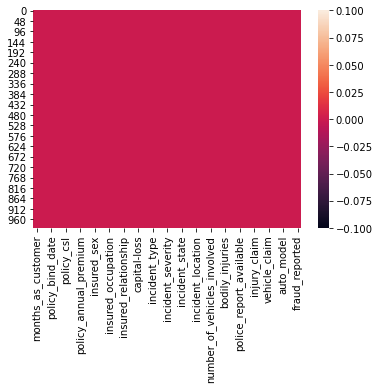

In [58]:
sns.heatmap(df.isnull()) 

Thus visually there is no missing value .

In [59]:
df.duplicated().sum()

0

Thus we see there is no dulpicate values

In [60]:
#identifying the question mark in collision_type column
df.loc[df['collision_type']=='?']

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
1,228,42,27-06-2006,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
4,228,44,06-06-2014,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
13,121,34,26-10-2012,OH,100/300,1000,936.61,0,FEMALE,MD,armed-forces,bungie-jumping,wife,52800,-32800,08-01-2015,Parked Car,?,Minor Damage,None,SC,Springfield,6582 Elm Lane,5,1,NO,1,1,NO,7280,1120,1120,5040,Toyota,Highlander,2010,N
26,257,43,20-09-1990,IN,100/300,2000,1322.10,0,MALE,High School,prof-specialty,golf,own-child,0,-29200,28-01-2015,Parked Car,?,Minor Damage,Police,PA,Arlington,2533 Elm St,4,1,YES,1,3,YES,9020,1640,820,6560,Toyota,Camry,2005,N
27,202,34,18-07-2002,IN,100/300,500,848.07,3000000,MALE,JD,exec-managerial,chess,not-in-family,31000,-30200,07-01-2015,Vehicle Theft,?,Minor Damage,None,VA,Northbrook,3790 Andromedia Hwy,5,1,YES,2,1,?,5720,1040,520,4160,Suburu,Forrestor,2003,Y
37,289,49,03-02-1993,IL,500/1000,2000,1222.48,0,FEMALE,JD,priv-house-serv,golf,unmarried,0,0,18-01-2015,Parked Car,?,Minor Damage,None,WV,Arlington,6676 Tree Lane,16,1,NO,1,1,YES,5330,1230,820,3280,Suburu,Legacy,2001,N
48,175,34,07-01-2008,IN,500/1000,1000,1123.87,8000000,FEMALE,PhD,protective-serv,dancing,other-relative,0,0,26-02-2015,Vehicle Theft,?,Trivial Damage,Police,NY,Arlington,6619 Flute Ave,5,1,?,2,0,YES,7290,810,810,5670,Volkswagen,Passat,1995,N
51,91,27,20-08-1994,IL,100/300,2000,1073.83,0,FEMALE,JD,farming-fishing,polo,husband,0,0,17-01-2015,Vehicle Theft,?,Trivial Damage,None,NY,Arlington,2280 4th Ave,4,1,?,1,2,?,7260,1320,660,5280,BMW,M5,2008,N
52,217,39,02-06-2002,IN,100/300,1000,1530.52,0,MALE,College,armed-forces,basketball,not-in-family,0,0,22-02-2015,Vehicle Theft,?,Minor Damage,None,WV,Northbend,2644 Elm Drive,8,1,?,2,1,YES,4300,430,430,3440,Toyota,Corolla,2000,N
54,195,39,17-08-2014,OH,250/500,1000,1393.57,0,MALE,PhD,machine-op-inspct,movies,not-in-family,47600,-39600,27-02-2015,Parked Car,?,Minor Damage,Police,VA,Northbend,5821 2nd St,5,1,NO,0,1,YES,2640,480,480,1680,Ford,F150,2009,N


In [61]:
#identifying the question mark in property_damage column
df.loc[df['property_damage']=='?']

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
1,228,42,27-06-2006,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
3,256,41,25-05-1990,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
6,137,34,04-06-2000,IN,250/500,1000,1333.35,0,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
7,165,37,03-02-1990,IL,100/300,1000,1137.03,0,MALE,Associate,tech-support,base-jumping,unmarried,0,0,27-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Police,VA,Columbus,3525 3rd Hwy,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N
16,70,26,08-06-2005,OH,500/1000,1000,1199.44,5000000,MALE,College,machine-op-inspct,hiking,own-child,63600,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Other,NY,Riverwood,5074 3rd St,0,3,?,1,2,YES,52110,5790,5790,40530,Nissan,Maxima,2012,N
19,196,39,02-08-1992,IN,500/1000,2000,1475.73,0,FEMALE,High School,handlers-cleaners,camping,own-child,57000,-27300,22-02-2015,Multi-vehicle Collision,Side Collision,Major Damage,Police,VA,Columbus,8101 3rd Ridge,8,3,?,2,0,NO,60400,6040,6040,48320,Nissan,Pathfinder,2014,N
21,217,41,27-11-2005,IL,500/1000,2000,875.15,0,FEMALE,Associate,machine-op-inspct,skydiving,own-child,46700,0,10-02-2015,Multi-vehicle Collision,Side Collision,Total Loss,Police,SC,Arlington,8957 Weaver Drive,15,3,?,1,2,?,37840,0,4730,33110,Accura,RSX,1996,N
23,413,55,08-02-1991,IN,100/300,2000,1268.79,0,MALE,MD,priv-house-serv,chess,own-child,0,-31000,19-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Ambulance,WV,Northbend,5667 4th Drive,15,1,?,2,2,?,98160,8180,16360,73620,Dodge,RAM,2011,Y
36,62,28,09-03-2003,IL,100/300,1000,988.45,0,FEMALE,Masters,protective-serv,camping,unmarried,0,0,09-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Police,NY,Northbrook,4981 Weaver St,3,1,?,1,1,YES,60200,6020,6020,48160,Suburu,Forrestor,2004,Y
38,431,54,25-11-2002,IN,500/1000,2000,1155.55,0,FEMALE,MD,craft-repair,bungie-jumping,unmarried,65700,0,21-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Police,NY,Hillsdale,3930 Embaracadero St,4,3,?,2,0,?,62300,12460,6230,43610,Jeep,Wrangler,2007,N


In [62]:
#identyfying the question mark in police_report_available
df.loc[df['police_report_available']=='?']

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
1,228,42,27-06-2006,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
6,137,34,04-06-2000,IN,250/500,1000,1333.35,0,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
9,212,42,25-07-2011,IL,100/300,500,1315.68,0,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N
10,235,42,26-05-2002,OH,100/300,500,1253.12,4000000,FEMALE,Masters,exec-managerial,dancing,other-relative,38400,0,06-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Police,NY,Northbend,1558 1st Ridge,22,1,YES,2,2,?,87010,7910,15820,63280,Ford,F150,2002,N
20,460,62,25-06-2002,IN,250/500,1000,1187.96,4000000,MALE,JD,other-service,bungie-jumping,own-child,0,0,01-01-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,5380 Pine St,20,3,NO,1,0,?,47160,0,5240,41920,Suburu,Impreza,2011,N
21,217,41,27-11-2005,IL,500/1000,2000,875.15,0,FEMALE,Associate,machine-op-inspct,skydiving,own-child,46700,0,10-02-2015,Multi-vehicle Collision,Side Collision,Total Loss,Police,SC,Arlington,8957 Weaver Drive,15,3,?,1,2,?,37840,0,4730,33110,Accura,RSX,1996,N
23,413,55,08-02-1991,IN,100/300,2000,1268.79,0,MALE,MD,priv-house-serv,chess,own-child,0,-31000,19-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Ambulance,WV,Northbend,5667 4th Drive,15,1,?,2,2,?,98160,8180,16360,73620,Dodge,RAM,2011,Y
27,202,34,18-07-2002,IN,100/300,500,848.07,3000000,MALE,JD,exec-managerial,chess,not-in-family,31000,-30200,07-01-2015,Vehicle Theft,?,Minor Damage,None,VA,Northbrook,3790 Andromedia Hwy,5,1,YES,2,1,?,5720,1040,520,4160,Suburu,Forrestor,2003,Y
30,64,25,18-02-2000,IL,250/500,1000,954.16,0,MALE,Masters,prof-specialty,video-games,husband,53200,0,18-01-2015,Multi-vehicle Collision,Side Collision,Major Damage,Ambulance,SC,Columbus,4687 5th Drive,22,4,NO,0,0,?,75600,12600,12600,50400,Toyota,Corolla,2005,N
31,166,37,19-06-2008,IL,100/300,2000,1337.28,8000000,MALE,JD,craft-repair,reading,husband,27500,0,28-02-2015,Multi-vehicle Collision,Side Collision,Major Damage,Police,WV,Riverwood,9038 2nd Lane,10,3,NO,2,2,?,67140,7460,7460,52220,Ford,F150,2006,Y


Thus it shows the column with question marks which is replace with Nan. 

In [63]:
# replacing the "?" filled rows with nan values and then again nan values to mode imputaion
df['collision_type'] = df['collision_type'].replace('?', np.nan)
df['property_damage'] = df['property_damage'].replace('?', np.nan)
df['police_report_available'] = df['police_report_available'].replace('?', np.nan)

In [64]:
df['collision_type'] #validating whether the changes  have been done with Nan values

0       Side Collision
1                  NaN
2       Rear Collision
3      Front Collision
4                  NaN
            ...       
995    Front Collision
996     Rear Collision
997     Side Collision
998     Rear Collision
999                NaN
Name: collision_type, Length: 1000, dtype: object

In [65]:
#reaplcing Nan value with  Mode Imputation
df["collision_type"].fillna(df["collision_type"].mode()[0],inplace=True)
df["property_damage"].fillna(df["property_damage"].mode()[0],inplace=True)
df["police_report_available"].fillna(df["police_report_available"].mode()[0],inplace=True)

In [66]:
df['collision_type'] #again validation whether mode imputaion has been done properly

0       Side Collision
1       Rear Collision
2       Rear Collision
3      Front Collision
4       Rear Collision
            ...       
995    Front Collision
996     Rear Collision
997     Side Collision
998     Rear Collision
999     Rear Collision
Name: collision_type, Length: 1000, dtype: object

Thus we see chnages have been made in collision_type with mode imputaion similarly with property_damage and police_report_available.  

In [67]:
# separating the Date column into seperate day - month -  year columns using pandas Datetime method
df['policy_bind_date'] = pd.to_datetime(df['policy_bind_date'])
df['policy_bind_Day'] = df['policy_bind_date'].apply(lambda x:x.day)
df['policy_bind_Month'] = df['policy_bind_date'].apply(lambda x:x.month)
df['policy_bind_Year'] = df['policy_bind_date'].apply(lambda x:x.year)

In [68]:
# separating the Date column into seperate day - month -  year columns using pandas Datetime method
df['incident_date'] = pd.to_datetime(df['incident_date'])
df['incident_Day'] = df['incident_date'].apply(lambda x:x.day)
df['incident_Month'] = df['incident_date'].apply(lambda x:x.month)
df['incident_Year'] = df['incident_date'].apply(lambda x:x.year)

In [69]:
 #dropping the original Date columns and incident_year as it pertains to only one year after separating the desired outputs
df.drop(columns = ['policy_bind_date','incident_date','incident_Year'], axis=1, inplace=True)

# Separating obj and non_obj data into separate data_frame

In [70]:
non_obj = df.select_dtypes(exclude ='object')
obj=df.select_dtypes(include='object')

In [71]:
#printing the non_obj column
nonobj_col = non_obj.columns.tolist()
nonobj_col

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year',
 'policy_bind_Day',
 'policy_bind_Month',
 'policy_bind_Year',
 'incident_Day',
 'incident_Month']

In [72]:
#printing the obj_column
obj_col = obj.columns.tolist()
obj_col

['policy_state',
 'policy_csl',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'incident_location',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

Thus we have separated the object datatype column names and numeric data type column names. We will be checking outliers and skewness only in continuous column not in categorical column.This makes our job easy

# Data Visualization

In [73]:
for col in obj_col:
    print(col)
    print(df[col].value_counts())   
    print('\n')

policy_state
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


policy_csl
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


insured_sex
FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


insured_education_level
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


insured_occupation
machine-op-inspct    93
prof-specialty       85
tech-support         78
exec-managerial      76
sales                76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


insured_hobbies
reading           64
paintball         57
exercise          57
bungie-jumping    56
movies            55
camping           55
golf           

This gives the number of records in each category of column

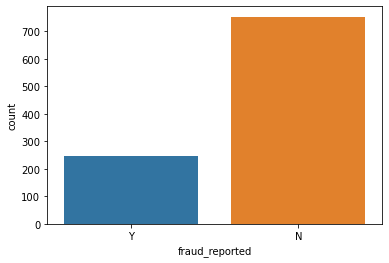

N    753
Y    247
Name: fraud_reported, dtype: int64


In [74]:
sns.countplot(x='fraud_reported', data=obj)  #Plotting the fraud reported Target Column  using countplot
plt.show()
print(df['fraud_reported'].value_counts())

Thus we see target column is imbalanced and we should be applying smote technique to balance it.We observe that There 753 cases not reported as fraud and there are 247 cases which are reported as fraud.

# Categorical Column Analysis

Pie-Plot

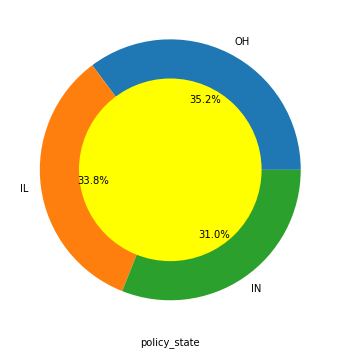

<Figure size 432x288 with 0 Axes>

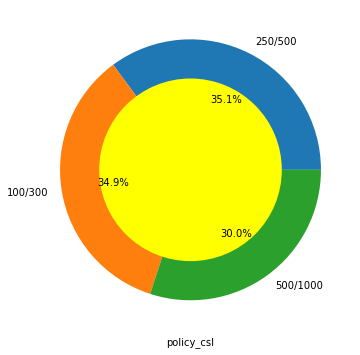

<Figure size 432x288 with 0 Axes>

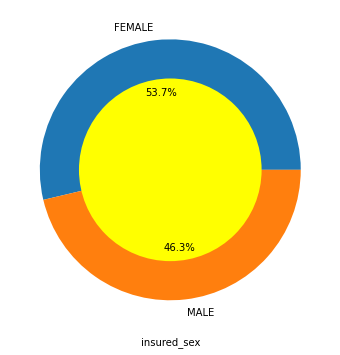

<Figure size 432x288 with 0 Axes>

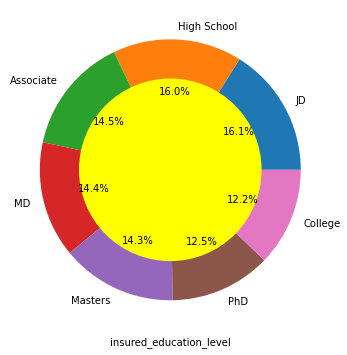

<Figure size 432x288 with 0 Axes>

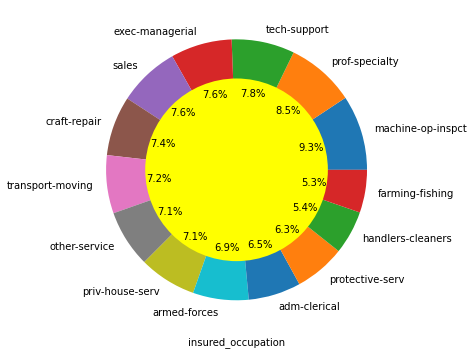

<Figure size 432x288 with 0 Axes>

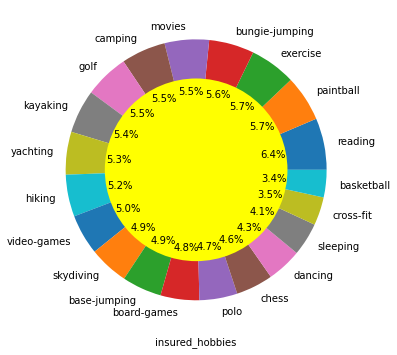

<Figure size 432x288 with 0 Axes>

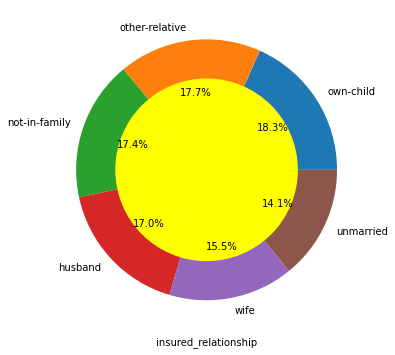

<Figure size 432x288 with 0 Axes>

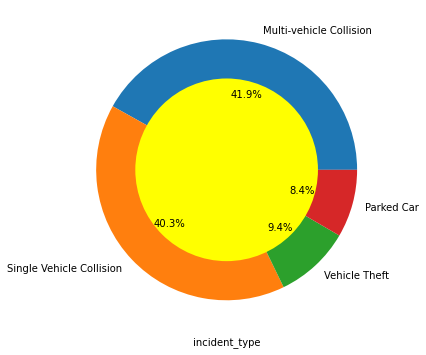

<Figure size 432x288 with 0 Axes>

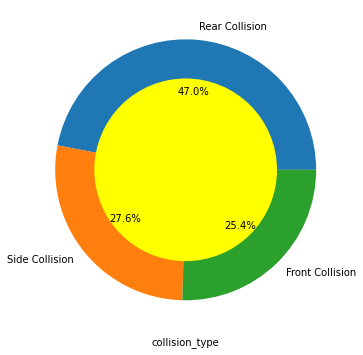

<Figure size 432x288 with 0 Axes>

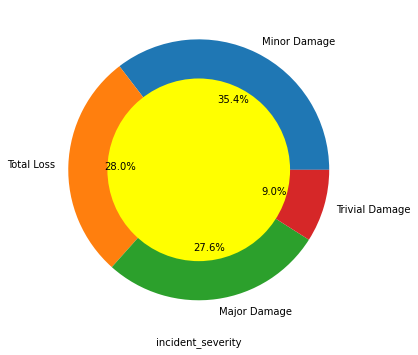

<Figure size 432x288 with 0 Axes>

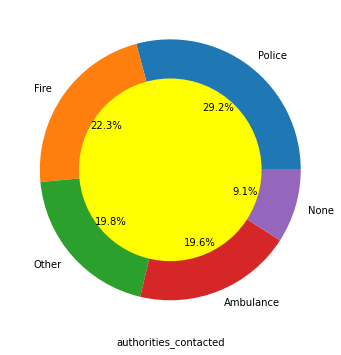

<Figure size 432x288 with 0 Axes>

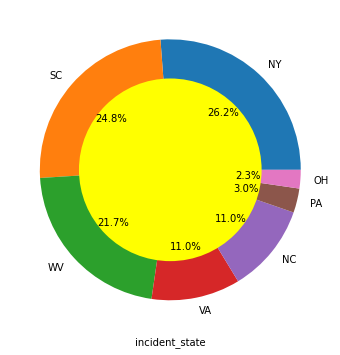

<Figure size 432x288 with 0 Axes>

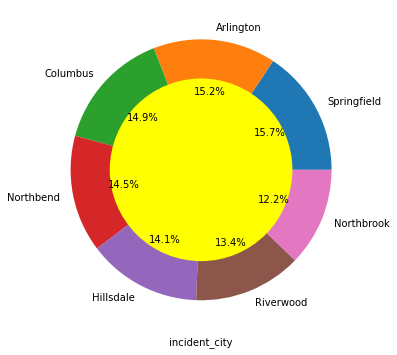

<Figure size 432x288 with 0 Axes>

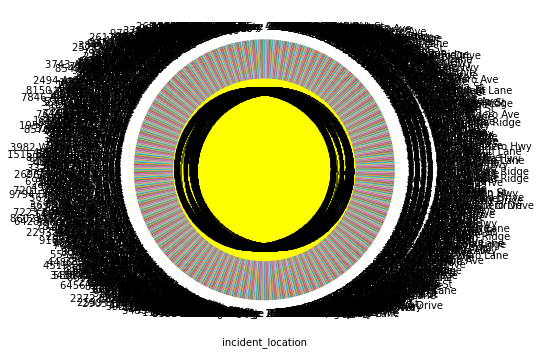

<Figure size 432x288 with 0 Axes>

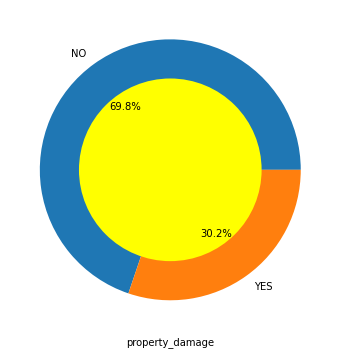

<Figure size 432x288 with 0 Axes>

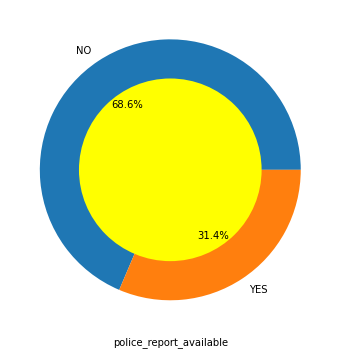

<Figure size 432x288 with 0 Axes>

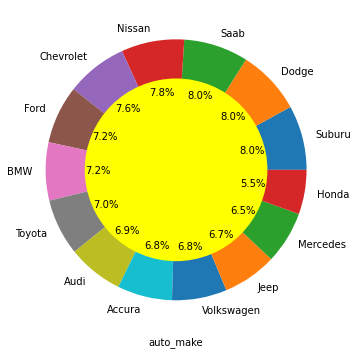

<Figure size 432x288 with 0 Axes>

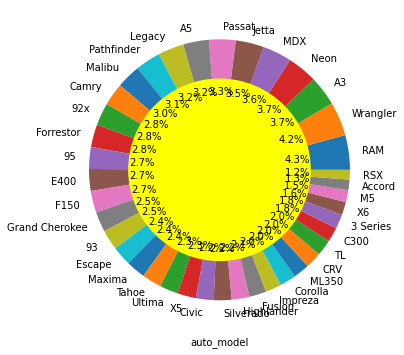

<Figure size 432x288 with 0 Axes>

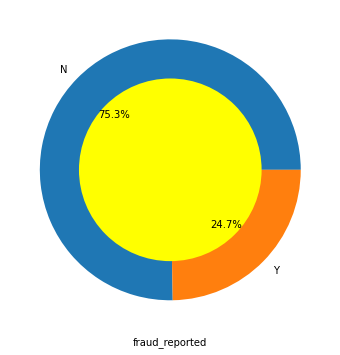

<Figure size 432x288 with 0 Axes>

In [75]:
for i in obj:
        plt.figure(figsize=(10,6))
        obj[i].value_counts().plot.pie(autopct='%1.1f%%')
        centre=plt.Circle((0,0),0.7,fc='yellow')
        fig=plt.gcf()
        fig.gca().add_artist(centre)
        plt.xlabel(i)
        plt.ylabel('')
        plt.figure()

Thus,we see that with the help of pie-plot,we get a quick snapshot of various columns showing percentages of each category in the 
column.Thus we see,
1.OH(Ohio) shows 35.2% which is the highest and least is IN(Indiana) shows 31% of the policy_state.

2.250/500 shows 35.1% which is the highest  and least is 30% consists of 500/1000 policy_csl.

3.Female shows Maximum percentage that is 53.7% and male is arounf 46.3%.

4.As per the educational level insured,High school and JD shows highest and least is College.

5.As per the occupation,machine-op-inspct and prof-specialty shows 9.3% and 8.5% highest amaong all and least is farming-fishing.

6.As per the hobbies,reading,paintball,exercises shows high percentage among all.

7.As per relationship,own-child and other relatives shows high percentage of 18.3% and 17.7% and least is unmarried.

8.As per incident_type,multi_vehicle collision shows highest percentage of 41.9% followed by single vehicle collision of 40.3% ,least is parked car.

9.As per collision_type,rear collision represent 47% whcih is highest among all.

10.As per incident_severity,minor damage represnts 35.4% being the highest.

11.As per the authorities_contacted,Police being contacted represents 29.2% and least is None that is 9.1%.

12.Newyork represnt the highest percentage of 26.2% among all the state.

13.Springfield and Arlington comprises the highest percentage among all the city.

14.Around 69.8% said there were no property damage with rest to counterparts.

15.Around 68.6% of the people said police report was not available.

16.with respect to auto_make,Saab,Suburu and Dodge comprises of 8%,Nissan,Chevrolet,Ford,BMW,Toyota are all around7-7.8%.

17.As per auto-model,RAM and wrangler comprises the highest.

18.As per fraud_reported,75.3% of the fraud not reported and rest reported.

Bar plot

In [81]:
def univariateAnalysis_category(obj):
    print("Details of " + obj)
    print("----------------------------------------------------------------")
    print(df[obj].value_counts())
    plt.figure()
    df[obj].value_counts().plot.bar(title="Frequency Distribution of " + obj)#, color = "blue")
    plt.show()
    print("       ")

Details of policy_state
----------------------------------------------------------------
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


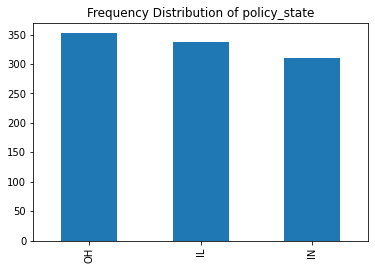

       
Details of policy_csl
----------------------------------------------------------------
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


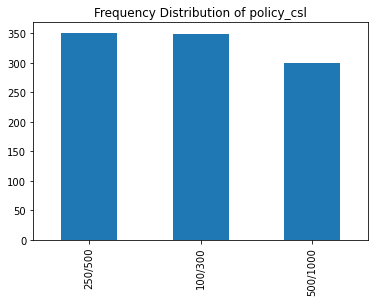

       
Details of insured_sex
----------------------------------------------------------------
FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


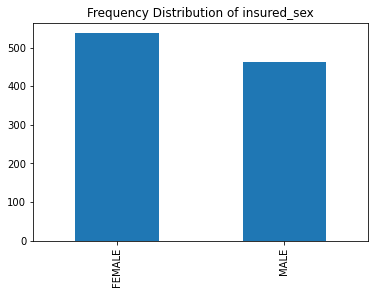

       
Details of insured_education_level
----------------------------------------------------------------
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


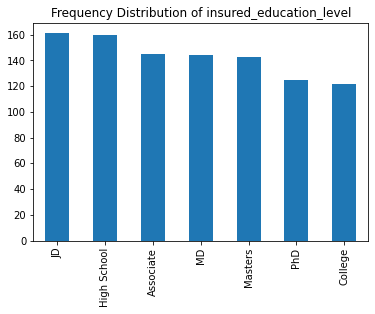

       
Details of insured_occupation
----------------------------------------------------------------
machine-op-inspct    93
prof-specialty       85
tech-support         78
exec-managerial      76
sales                76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


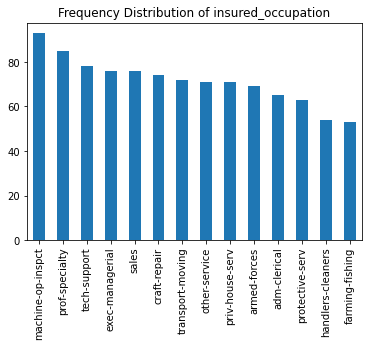

       
Details of insured_hobbies
----------------------------------------------------------------
reading           64
paintball         57
exercise          57
bungie-jumping    56
movies            55
camping           55
golf              55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


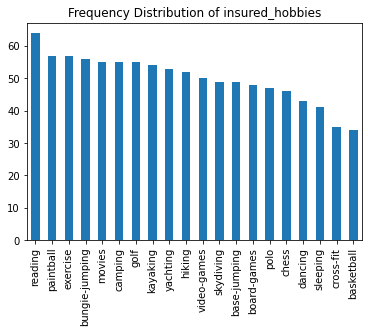

       
Details of insured_relationship
----------------------------------------------------------------
own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64


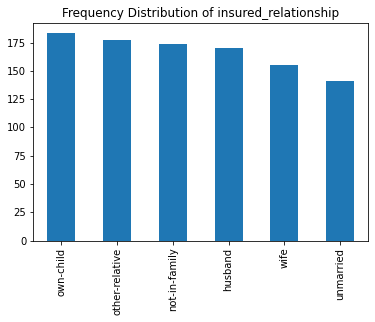

       
Details of incident_type
----------------------------------------------------------------
Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


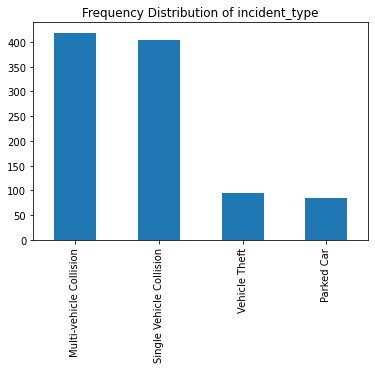

       
Details of collision_type
----------------------------------------------------------------
Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


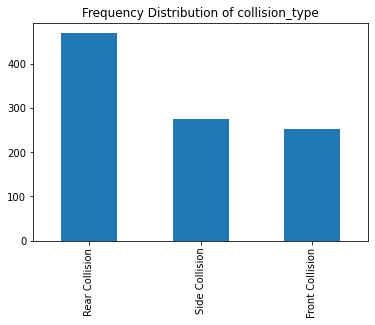

       
Details of incident_severity
----------------------------------------------------------------
Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64


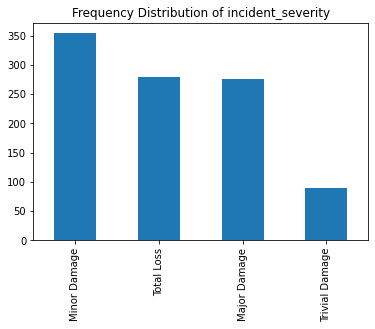

       
Details of authorities_contacted
----------------------------------------------------------------
Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64


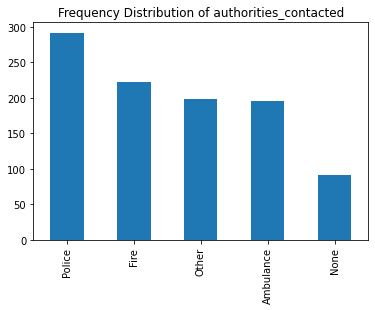

       
Details of incident_state
----------------------------------------------------------------
NY    262
SC    248
WV    217
VA    110
NC    110
PA     30
OH     23
Name: incident_state, dtype: int64


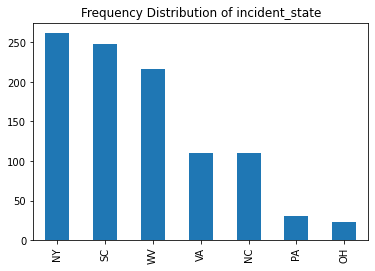

       
Details of incident_city
----------------------------------------------------------------
Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


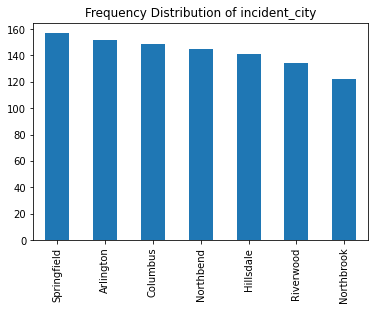

       
Details of incident_location
----------------------------------------------------------------
9942 Tree Ave            1
1830 Sky St              1
3818 Texas Ridge         1
1437 3rd Lane            1
4964 Elm Lane            1
                        ..
3110 Lincoln Lane        1
3320 5th Hwy             1
1578 5th Lane            1
6668 Andromedia Ridge    1
2337 Lincoln Hwy         1
Name: incident_location, Length: 1000, dtype: int64


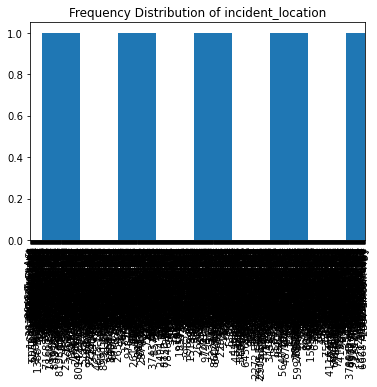

       
Details of property_damage
----------------------------------------------------------------
NO     698
YES    302
Name: property_damage, dtype: int64


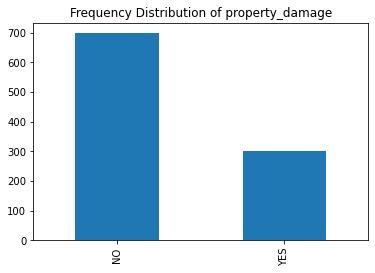

       
Details of police_report_available
----------------------------------------------------------------
NO     686
YES    314
Name: police_report_available, dtype: int64


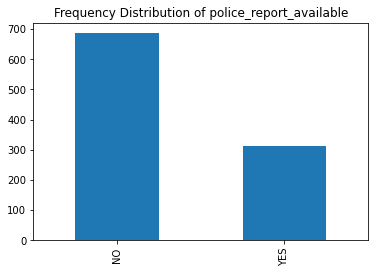

       
Details of auto_make
----------------------------------------------------------------
Suburu        80
Dodge         80
Saab          80
Nissan        78
Chevrolet     76
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64


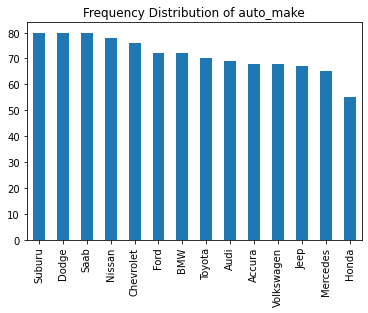

       
Details of auto_model
----------------------------------------------------------------
RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
Camry             28
92x               28
Forrestor         28
95                27
E400              27
F150              27
Grand Cherokee    25
93                25
Escape            24
Maxima            24
Tahoe             24
Ultima            23
X5                23
Civic             22
Silverado         22
Highlander        22
Fusion            21
Impreza           20
Corolla           20
ML350             20
CRV               20
TL                20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64


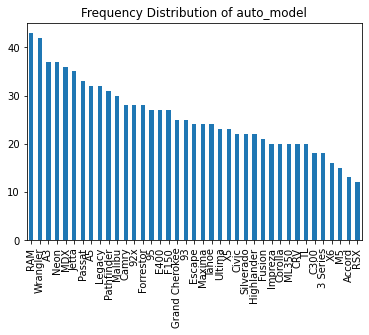

       
Details of fraud_reported
----------------------------------------------------------------
N    753
Y    247
Name: fraud_reported, dtype: int64


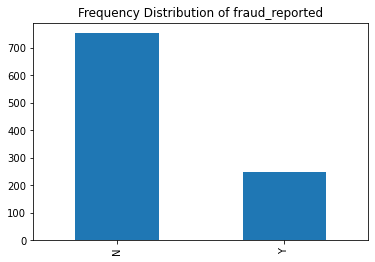

In [82]:
for x in obj:
    univariateAnalysis_category(x)

OBSERVATIONS:

1.Thus policy_bind_date contains only the date of the policy .

2.Policy_csL:Thus we see that 250/500 category has a slighty higher record  than the 100-300 and 500/1000 categories.

3.Policy_state:OH represents Ohio which has larger records available than IL(Illinois) and IN(Indiana) IL & IN represent similar records available.

4.Insured_sex:Female are slightly higher side than male counterparts.

5.Insured_education_level:People having background of JD and High School are slighly higher than the rest.least is college.

6.insured_occupation:People having the occupation machine-op-inspct,prof-specialty are having higher records than the rest.Least is for  farming-fishing.

7.insured-hobbies:People whose hobbies are reading,exercise and paintball are having high records than the rest ,least being the basketball,cross-fit.

8.insured_relationship:own-child are slightly higher insured than rest.we see under insured_relationship,its distribution is somewhat equal.

9.incident_date:this just give the incident date.

10.incident_type:Multi_vehicle collision can be seen on higher side followed by single vehicle collision ,least is parked car.    
11.collision_type: Rear_collision and side collision are on higher side and some people not able be say.

12.incident_severity:Minor damage are on higher side followed by total loss.

13.authorities_contacted:People who contacted the police are on the higher side followed by the people who contacted the fire
department.

14.incident_state:Majority of the records are covered by NY(Newyork),SC(South carolina) and West Virginia.

15:incident_city:Mmajority of the records for city are covered by Springfield,Arlington,Columbus.

16.incident location: we see where and how many incidents happedend in that location ,mostly incidents happening is one and it is equally distributed .

17. property damage:Most of the people are not able to say , next is around 338 people says that there is no damagae to the property and rest say there is damamge to property.

18.police_report_available:  Around 31.4% people are able to produce genuine police report and rest 34.3% people either not able to produce any report or they dont have the reports.

19.auto_make:saab,suburu and dodge are having slightly higher records avaiable than the rest.least is honda. 
 
20.auto_model:RAM and wrangler are on the higher side than the rest,least is RSX.    

In [83]:
def univariateAnalysis_numeric(non_obj,nbins):
    plt.figure(figsize=(5,5))
    print("----------------------------------------------------------------------------")
    sns.displot(df[non_obj], kde=True)#, color='blue')
    plt.title("Distribution of " + non_obj)
    plt.show()
    
    plt.figure(figsize=(5,5))
    print("----------------------------------------------------------------------------")
    ax = df.boxplot(non_obj,patch_artist=True)
    plt.title("BoxPlot of " + non_obj)
    plt.ylabel('Values')
    plt.show()

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

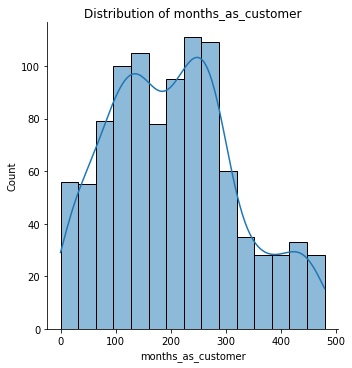

----------------------------------------------------------------------------


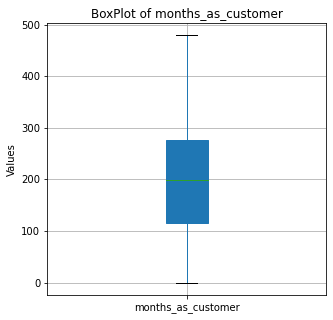

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

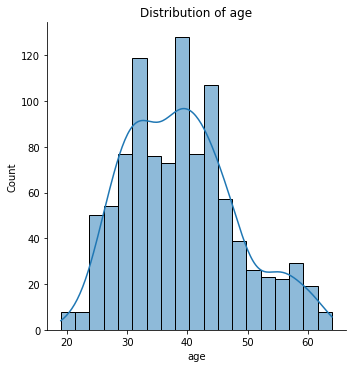

----------------------------------------------------------------------------


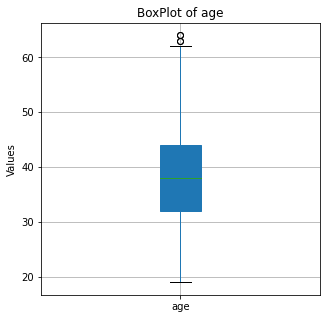

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

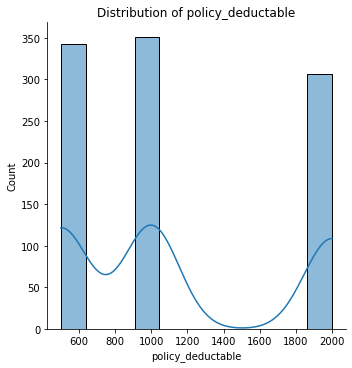

----------------------------------------------------------------------------


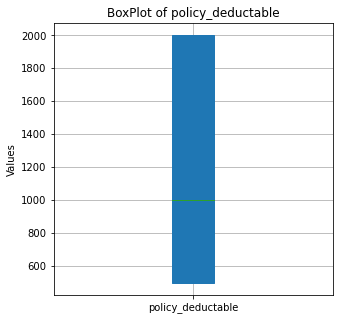

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

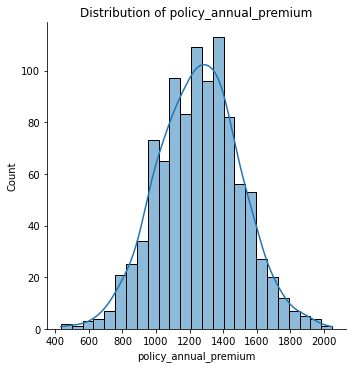

----------------------------------------------------------------------------


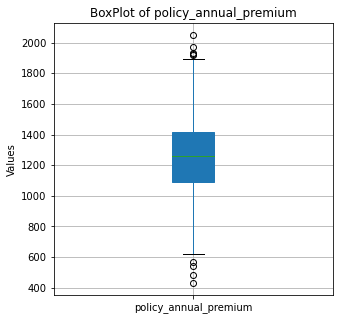

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

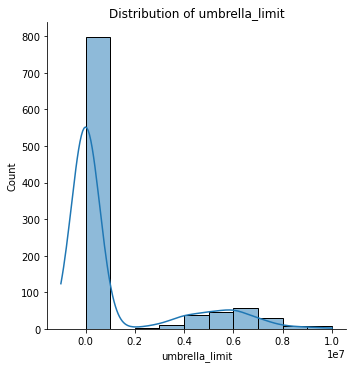

----------------------------------------------------------------------------


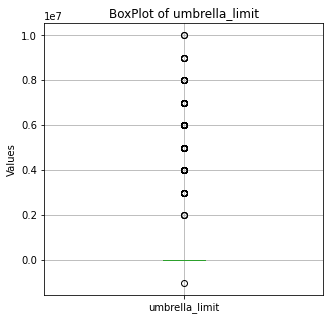

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

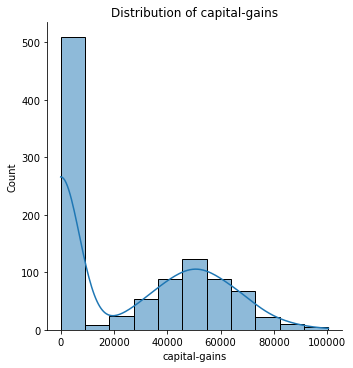

----------------------------------------------------------------------------


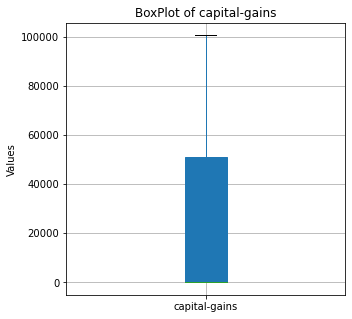

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

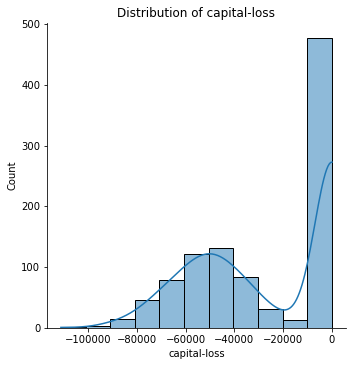

----------------------------------------------------------------------------


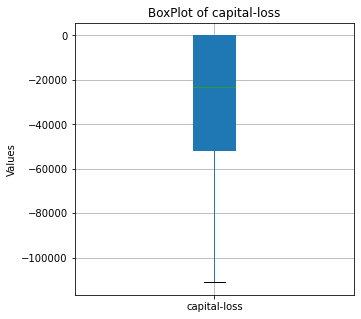

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

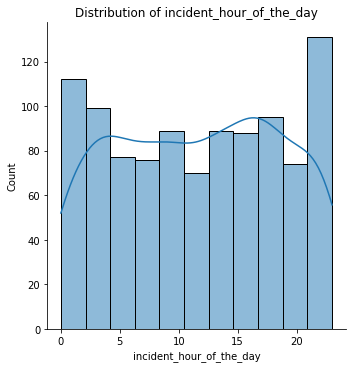

----------------------------------------------------------------------------


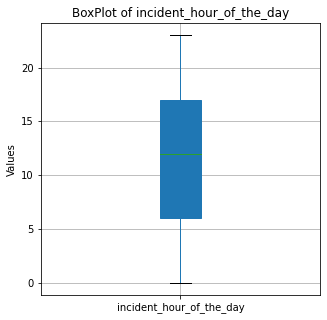

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

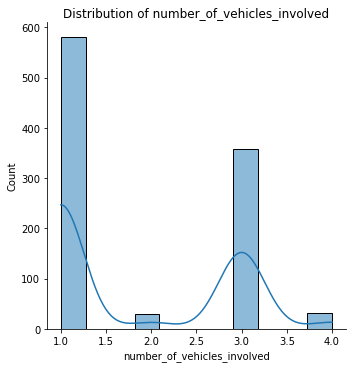

----------------------------------------------------------------------------


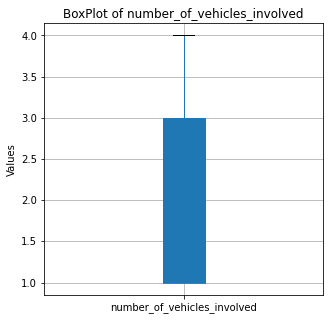

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

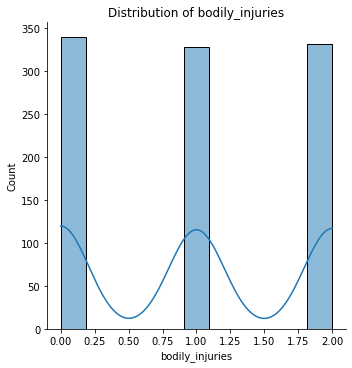

----------------------------------------------------------------------------


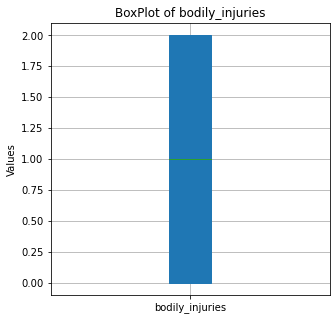

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

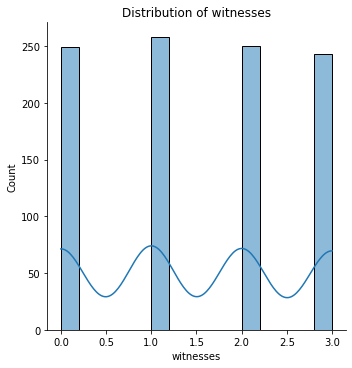

----------------------------------------------------------------------------


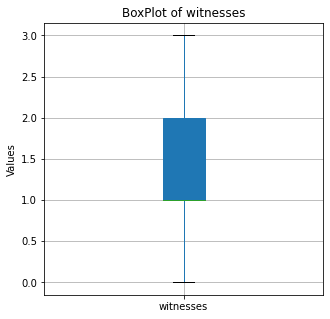

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

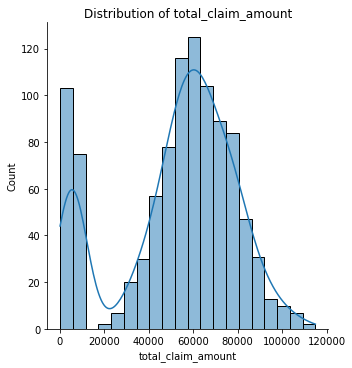

----------------------------------------------------------------------------


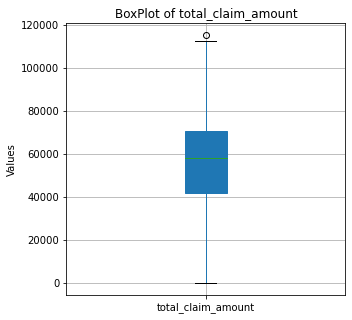

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

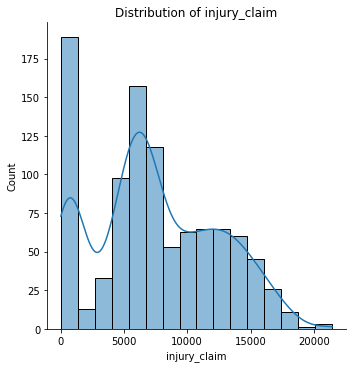

----------------------------------------------------------------------------


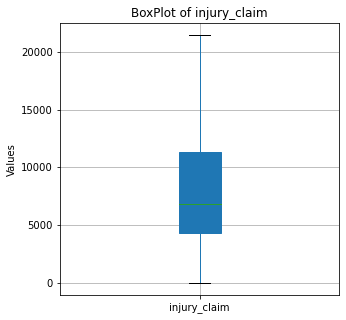

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

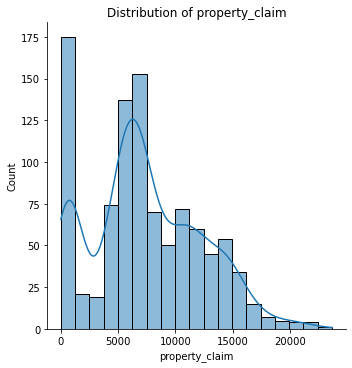

----------------------------------------------------------------------------


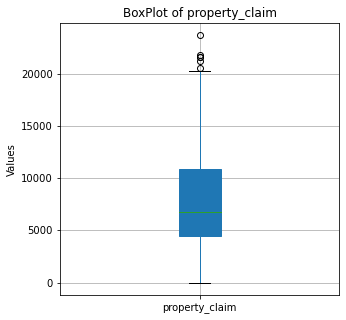

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

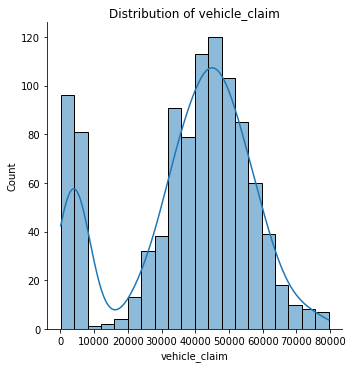

----------------------------------------------------------------------------


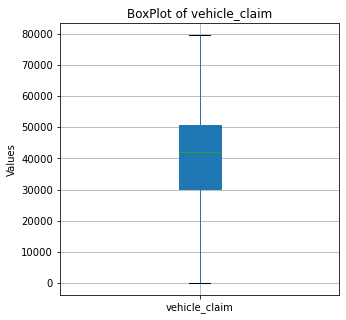

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

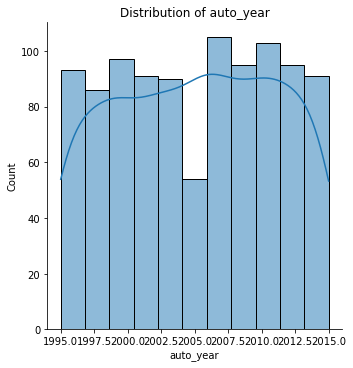

----------------------------------------------------------------------------


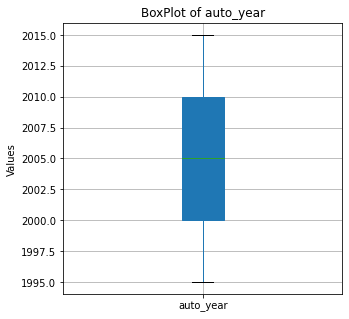

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

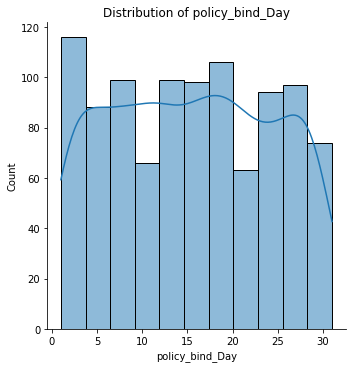

----------------------------------------------------------------------------


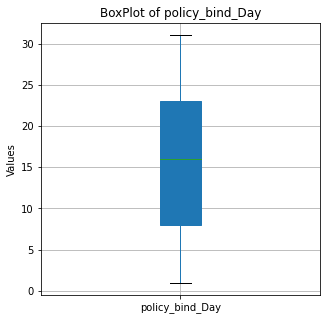

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

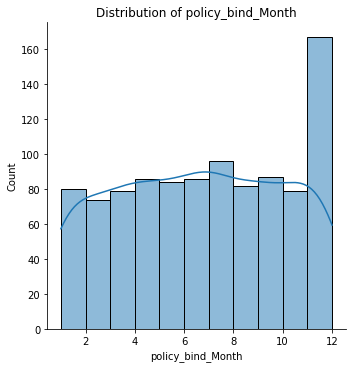

----------------------------------------------------------------------------


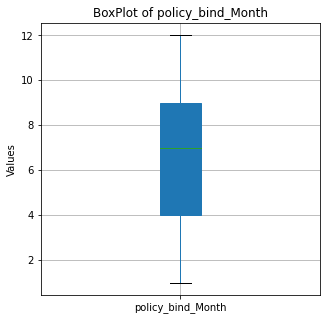

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

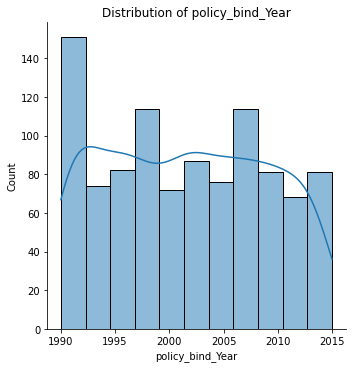

----------------------------------------------------------------------------


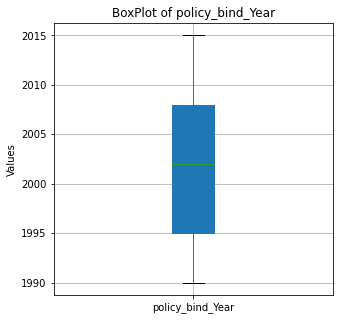

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

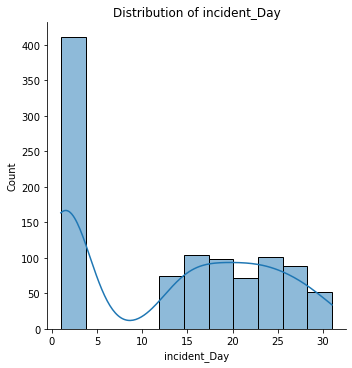

----------------------------------------------------------------------------


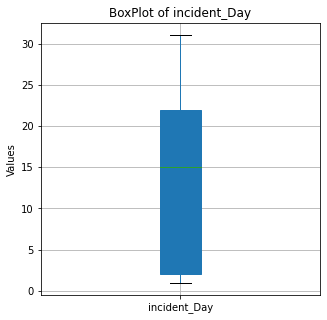

----------------------------------------------------------------------------


<Figure size 360x360 with 0 Axes>

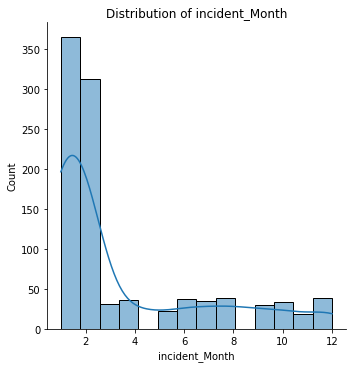

----------------------------------------------------------------------------


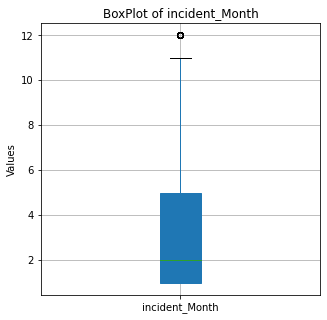

In [84]:
for x in non_obj:
    univariateAnalysis_numeric(x, 100);

Thus we can see Outliers are present in policy_annual_premium,umbrella limit,total_claim_amount,property_claim.
Also most of the columns are not normally distributed. 

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

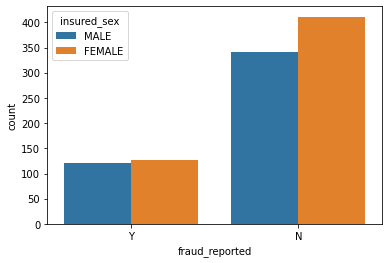

In [85]:
sns.countplot(x='fraud_reported',data=df, hue='insured_sex')

Thus we see that  majority of the fraud are not reported in case of female. 

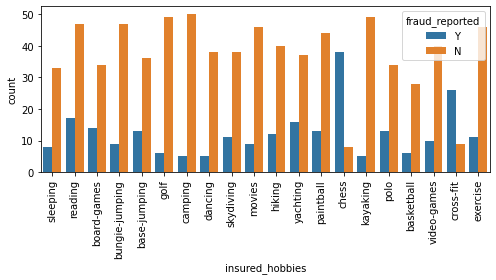

In [86]:
plt.figure(figsize=(7,4))
sns.countplot(x='insured_hobbies',data=df, hue='fraud_reported')
plt.xticks(rotation=90)
plt.tight_layout()

Those who are playing chess and cross-fit are having most number of fraud cases comapring to others.

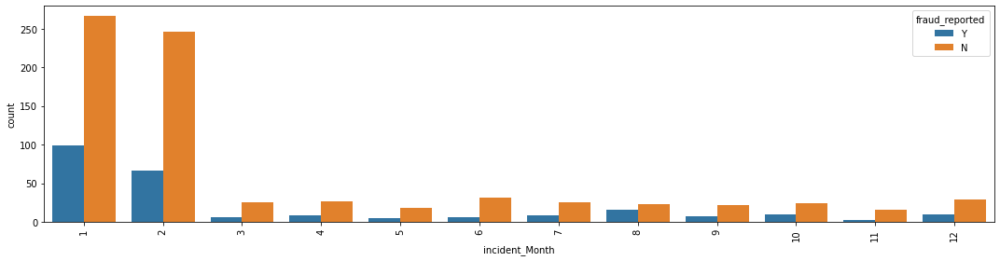

In [87]:
plt.figure(figsize=(15,4))
sns.countplot(x='incident_Month',data=df, hue='fraud_reported')
plt.xticks(rotation=90)
plt.tight_layout()

Thus we see that fraud case was reported highest on the first and second month. 

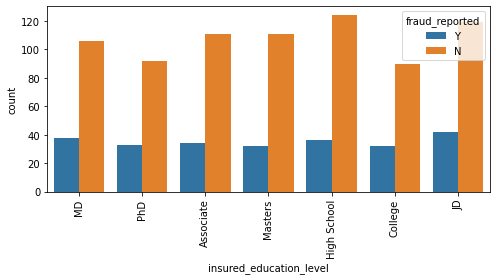

In [88]:
plt.figure(figsize=(7,4))
sns.countplot(x='insured_education_level',data=df, hue='fraud_reported')
plt.xticks(rotation=90)
plt.tight_layout()

Thus we see that eduactional level is not impacted by fraud cases.It is almost equally distributed in fraud cases.

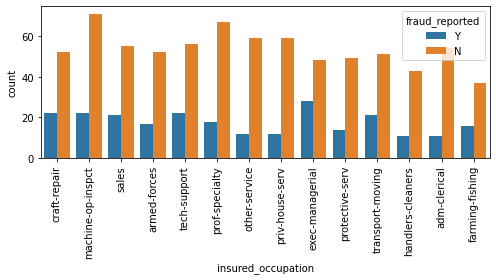

In [89]:
plt.figure(figsize=(7,4))
sns.countplot(x='insured_occupation',data=df, hue='fraud_reported')
plt.xticks(rotation=90)
plt.tight_layout()

Thus we see those who are exec-managerial were having higher fraud cases compare to other occupation.

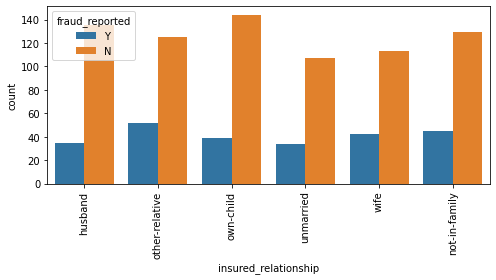

In [90]:
plt.figure(figsize=(7,4))
sns.countplot(x='insured_relationship',data=df, hue='fraud_reported')
plt.xticks(rotation=90)
plt.tight_layout()

In retionship,those who are other_relative,wife and not in family seems to have higher fraud cases compare to other relationship.  

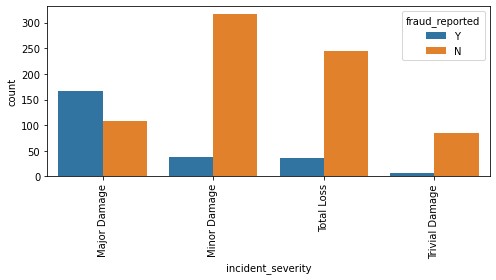

In [91]:
plt.figure(figsize=(7,4))
sns.countplot(x='incident_severity',data=df, hue='fraud_reported')
plt.xticks(rotation=90)
plt.tight_layout()

Thus we see that Major incident severity reported to have highest fraud cases which has exceed non fraud cases.

<AxesSubplot:xlabel='collision_type', ylabel='count'>

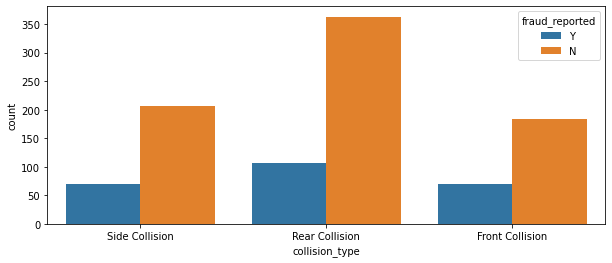

In [92]:
plt.figure(figsize=(10,4))
sns.countplot(x='collision_type',data=df, hue='fraud_reported')

There seems to be slightly higher fraud cases in rear collision followed by side and front collision.

<AxesSubplot:xlabel='incident_city', ylabel='count'>

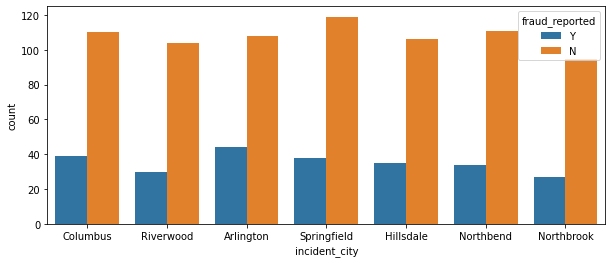

In [93]:
plt.figure(figsize=(10,4))
sns.countplot(x='incident_city',data=df, hue='fraud_reported')

Thus we can see that almost same count of fraud cases reported in each city ,still Arlingtom and Columbus are slightly higher. 

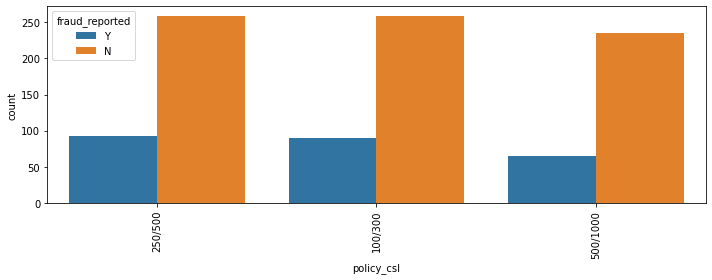

In [94]:
plt.figure(figsize=(10,4))
sns.countplot(x='policy_csl',data=df, hue='fraud_reported')
plt.xticks(rotation=90)
plt.tight_layout()

Thus we see that policy 250/500 and 100/300 are having slighet higher fraud cases and least is 500/1000. 

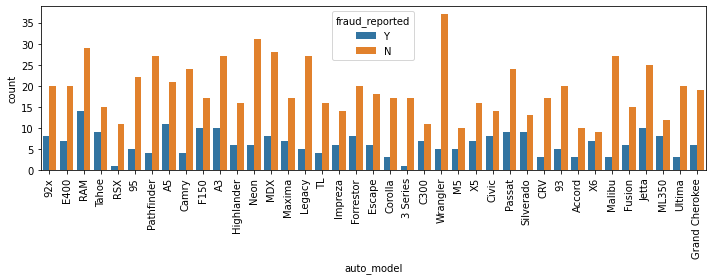

In [95]:
plt.figure(figsize=(10,4))
sns.countplot(x='auto_model',data=df, hue='fraud_reported')
plt.xticks(rotation=90)
plt.tight_layout()

The model of the auto where the fraud case reported is higher is RAM,A5,F150,A3,Jetta,Silverado.Wranger is the model when there is non raud cases higher than fraud case.

<AxesSubplot:xlabel='fraud_reported', ylabel='total_claim_amount'>

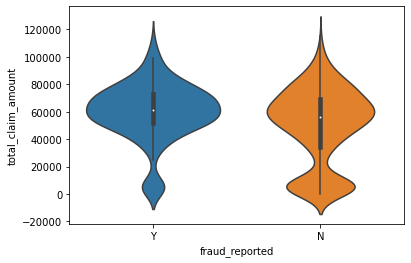

In [96]:
sns.violinplot(df['fraud_reported'] ,df['total_claim_amount'])

We obsreve that the number of frauds are more than non-fraud claims when the total claims were between 40k to 80k.

<AxesSubplot:xlabel='fraud_reported', ylabel='injury_claim'>

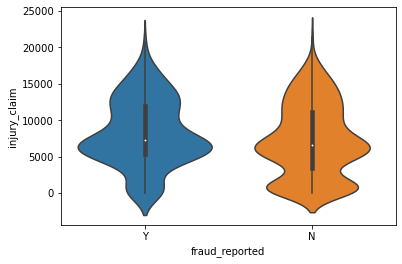

In [97]:
sns.violinplot(df['fraud_reported'] ,df['injury_claim'])

Thus we observe that there seem to be more frauds than non-fraud claims when the insurace claim is between 5k to 15k.

<AxesSubplot:xlabel='fraud_reported', ylabel='property_claim'>

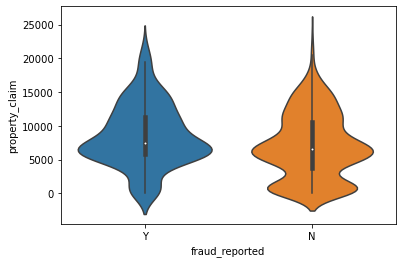

In [98]:
sns.violinplot(df['fraud_reported'] ,df['property_claim'])

we observe that there seem to be more frauds than non-fraud claims when the property claim is between 5k to 15k.

<AxesSubplot:xlabel='fraud_reported', ylabel='injury_claim'>

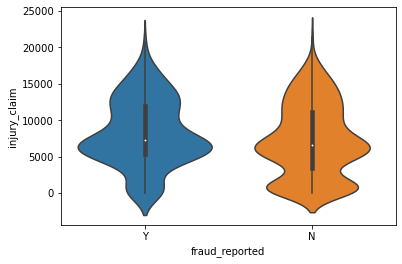

In [99]:
sns.violinplot(df['fraud_reported'] ,df['injury_claim'])

The number of frauds are more than the non-frauds when the injury claim amount is between 4.5k to 10.5 k.

<AxesSubplot:xlabel='fraud_reported', ylabel='vehicle_claim'>

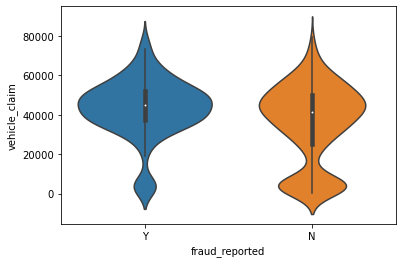

In [100]:
sns.violinplot(df['fraud_reported'] ,df['vehicle_claim'])

We observe that there seems to be more fraud cases than non fraud cases when the vehicle claim  amount is between approximately 
20k to 60k.

<AxesSubplot:xlabel='fraud_reported', ylabel='capital-loss'>

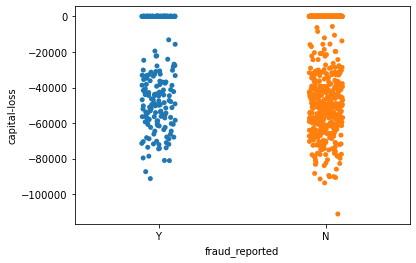

In [101]:
sns.stripplot(df['fraud_reported'] ,df['capital-loss'])

We saw that when there is fraud reported ,then capital loss to the company is more as the company has to settle the claim 
amount demanded by the customer than the premium paid by the customer.

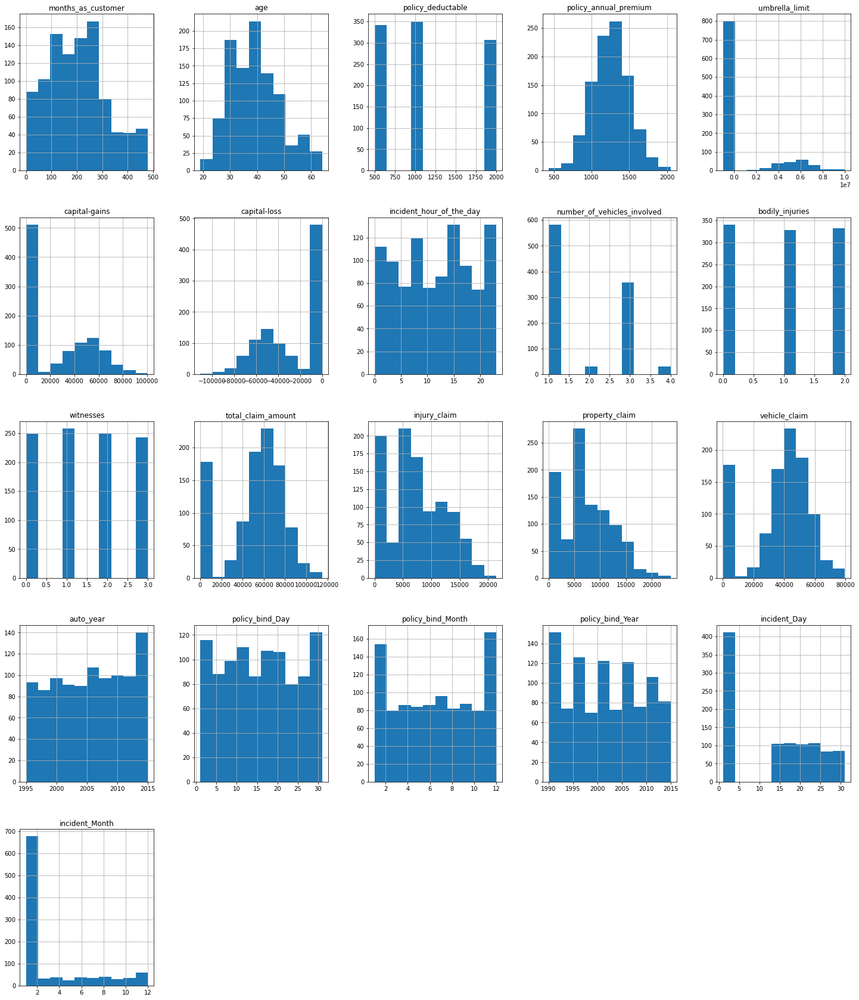

In [102]:
df.hist(figsize=(25,30))
plt.show()

Thus we see that some of the columns are normaly distributed like age,policy_annual_premium and rest are not normally distribued.

# Encoding the categorical object

I am using label encoder for target column and ordinal encoder for categorical column foe encoding.Machine learning algorithms will not understand, or not be able to deal with categorical variables .In other words, machine learning algorithms will perform better in terms of accuracy and other performance metrics when the data is represented as a number instead of categorical to a model for training and testing. 

Label encoding:Label Encoding refers to converting the labels into a numeric form so as to convert them into the machine-readable form.

An Ordinal Encoder is used to encode categorical features into an ordinal numerical value (ordered set). This approach transforms categorical value to numerical value in ordered sets.

In [103]:
# Label Encoder

le = LabelEncoder()
df["fraud_reported"] = le.fit_transform(df["fraud_reported"])
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
0,328,48,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,1,17,10,2014,25,1
1,228,42,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,1,27,6,2006,21,1
2,134,29,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,0,9,6,2000,22,2
3,256,41,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,1,25,5,1990,1,10
4,228,44,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,0,6,6,2014,17,2


In [104]:
# Ordinal Encoder

ole = OrdinalEncoder()
def ordinal_encode(df, column):
    df[column] = ole.fit_transform(df[column])
    return df

df=ordinal_encode(df, obj_col)
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
0,328,48,2.0,1.0,1000,1406.91,0,1.0,4.0,2.0,17.0,0.0,53300,0,2.0,2.0,0.0,4.0,4.0,1.0,996.0,5,1,1.0,1,2,1.0,71610,6510,13020,52080,10.0,1.0,2004,1.0,17,10,2014,25,1
1,228,42,1.0,1.0,2000,1197.22,5000000,1.0,4.0,6.0,15.0,2.0,0,0,3.0,1.0,1.0,4.0,5.0,5.0,628.0,8,1,0.0,0,0,0.0,5070,780,780,3510,8.0,12.0,2007,1.0,27,6,2006,21,1
2,134,29,2.0,0.0,2000,1413.14,5000000,0.0,6.0,11.0,2.0,3.0,35100,0,0.0,1.0,1.0,4.0,1.0,1.0,685.0,7,3,0.0,2,3,0.0,34650,7700,3850,23100,4.0,30.0,2007,0.0,9,6,2000,22,2
3,256,41,0.0,1.0,2000,1415.74,6000000,0.0,6.0,1.0,2.0,4.0,48900,-62400,2.0,0.0,0.0,4.0,2.0,0.0,669.0,5,1,0.0,1,2,0.0,63400,6340,6340,50720,3.0,34.0,2014,1.0,25,5,1990,1,10
4,228,44,0.0,2.0,1000,1583.91,6000000,1.0,0.0,11.0,2.0,4.0,66000,-46000,3.0,1.0,1.0,2.0,1.0,0.0,220.0,20,1,0.0,0,1,0.0,6500,1300,650,4550,0.0,31.0,2009,0.0,6,6,2014,17,2


Thus we see that above encoding has come into effect properly.

# Checking Outliers

In [105]:
df.shape

(1000, 40)

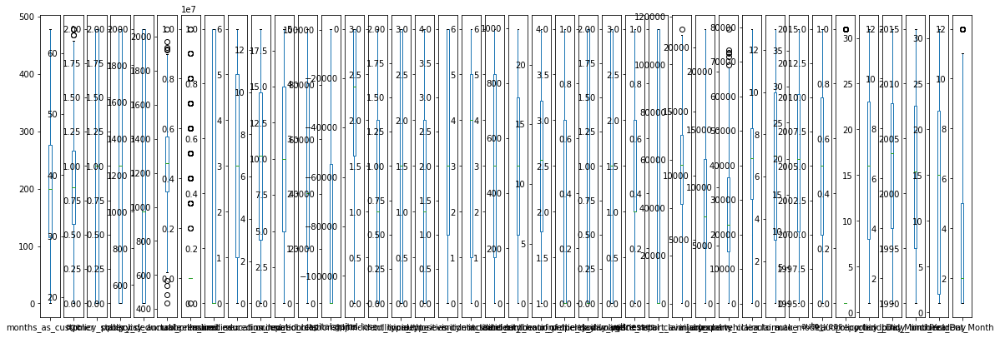

In [106]:
df.plot(kind ='box',subplots = True, figsize =[20,8])
plt.subplots_adjust(bottom=0.25)

In [107]:
#removal of outliers
z = np.abs(zscore(df))
threshold = 3
dfnew = df[(z<3).all(axis = 1)]

print ("Dataframe Shape before removing outliers: ", df.shape)
print ("Dataframe Shape after removing outliers: ", dfnew.shape)
print ("Percentage of data loss after outlier removal: ", (df.shape[0]-dfnew.shape[0])/df.shape[0]*100)

df=dfnew.copy() # reassigning to our original dataframe name

Dataframe Shape before removing outliers:  (1000, 40)
Dataframe Shape after removing outliers:  (980, 40)
Percentage of data loss after outlier removal:  2.0


 Thus we see percentage loss in the data is only 2% which is acceptable. 

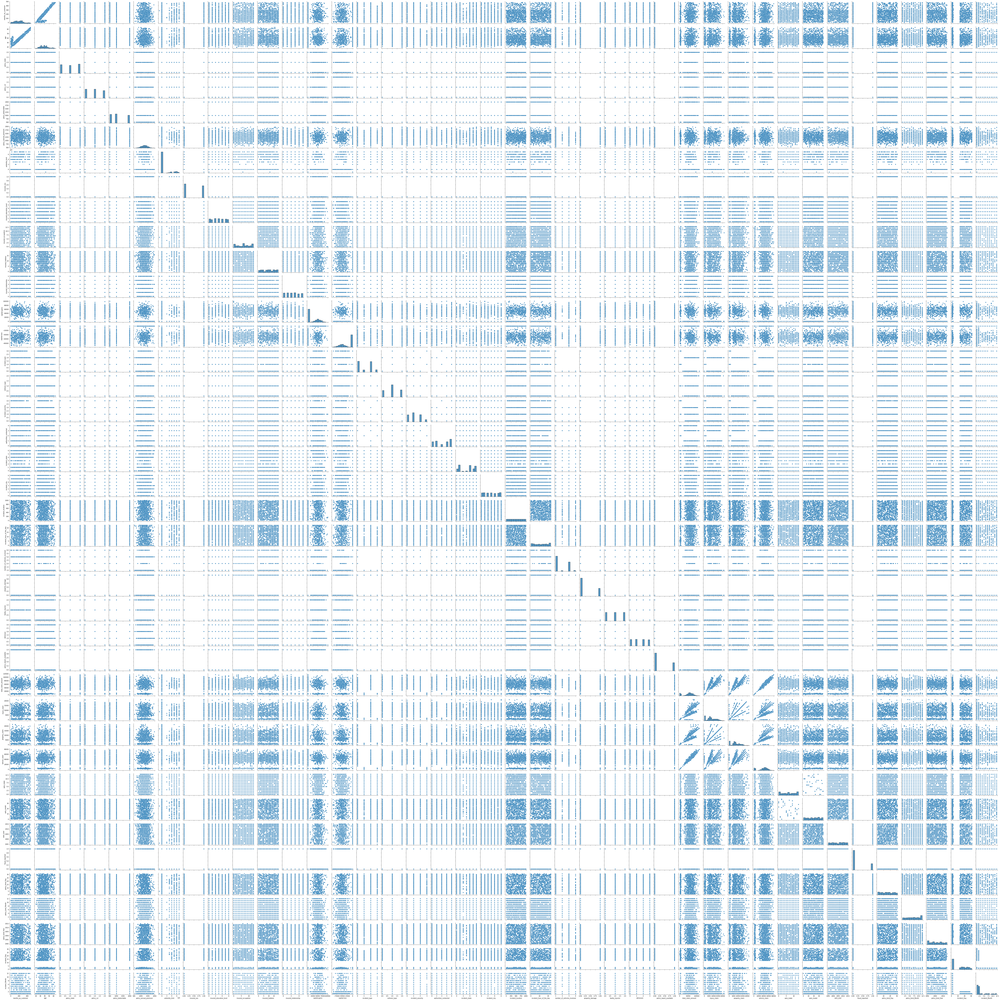

In [108]:
sns.pairplot(df) #shows multiple pairwise bivariate distributions in a dataset and shows relationship bw them.

# Correlation Analysis 

Correlation Analysis is statistical method that is used to discover if there is a relationship between two variables/datasets, and how strong that relationship may be.It is used to identify whether there is any significant connections, patterns, or trends between the two. 

A positive correlation result means that both variables increase in relation to each other, while a negative correlation means that as one variable decreases, the other increases.

Positive Correlation
Any score from +0.5 to +1 indicates a very strong positive correlation, which means that they both increase at the same time.

Negative Correlation
Any score from -0.5 to -1 indicate a strong negative correlation, which means that as one variable increases, the other decreases proportionally.

No Correlation
A score of 0 indicates that there is no correlation, or relationship, between the two variables.


In [109]:
corr=df.corr()
corr 

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
months_as_customer,1.000000,0.922960,-0.007183,-0.021855,0.031041,-0.003814,0.018213,0.059644,-0.000731,0.006925,-0.089358,0.071492,0.007468,0.023041,-0.016746,-0.073031,-0.064094,0.013782,0.015811,-0.006601,-0.011966,0.066198,0.011831,-0.000630,-0.007674,0.063574,-0.017200,0.058761,0.065062,0.036660,0.055941,0.049734,0.005130,0.000869,0.021285,0.050824,0.004207,-0.041914,-0.010538,0.019242
age,0.922960,1.000000,-0.020012,-0.013323,0.032036,0.005330,0.013256,0.073790,0.001647,0.014798,-0.079099,0.076129,-0.004529,0.012860,-0.026286,-0.076325,-0.064396,0.018441,0.012644,-0.006685,-0.009067,0.083720,0.020391,-0.008239,-0.012254,0.056360,-0.018135,0.067812,0.077149,0.062375,0.058918,0.033757,0.015322,0.005594,0.013279,0.053147,0.014492,-0.031709,-0.005843,0.018221
policy_state,-0.007183,-0.020012,1.000000,0.001653,0.017612,0.015089,-0.010921,-0.018002,-0.027173,-0.025357,-0.039501,-0.017060,0.068619,-0.031926,0.032373,0.049961,-0.028353,-0.014647,0.019456,-0.002809,0.030864,0.021926,-0.045514,-0.013576,0.012097,0.025838,0.065316,-0.014693,-0.048188,-0.006420,-0.006411,0.010259,-0.018008,-0.001160,0.034587,-0.000583,0.073692,-0.003045,0.016049,0.027889
policy_csl,-0.021855,-0.013323,0.001653,1.000000,0.009912,0.032654,0.013504,-0.003405,0.008337,0.016461,-0.003695,-0.034603,0.009786,-0.035589,0.005180,0.028139,0.017195,0.051030,0.035804,0.014380,0.050719,0.003918,-0.014658,-0.024497,0.001385,0.071361,-0.008979,-0.054128,-0.080098,-0.042876,-0.043987,-0.009395,0.042905,-0.030370,-0.032509,0.013568,-0.041283,-0.019409,-0.002278,-0.010904
policy_deductable,0.031041,0.032036,0.017612,0.009912,1.000000,-0.008300,0.013471,-0.006977,0.014101,-0.053888,-0.001923,-0.019000,0.031673,-0.019601,-0.032291,-0.055984,-0.016363,0.002769,0.000647,-0.047304,-0.010569,0.064732,0.046331,0.013074,-0.037263,0.071709,0.036275,0.023835,0.038459,0.071031,0.005279,-0.028032,-0.002591,0.030569,0.015774,0.013395,-0.054208,-0.054041,-0.018115,-0.010288
policy_annual_premium,-0.003814,0.005330,0.015089,0.032654,-0.008300,1.000000,-0.014107,0.041312,-0.021400,0.027827,-0.014226,0.004417,-0.006807,0.033133,0.051606,0.032604,-0.013911,-0.054425,0.048647,0.047771,0.009026,-0.006448,-0.044544,0.076447,0.027837,0.003433,0.032413,-0.000223,-0.024119,-0.014073,0.009521,0.009311,-0.038226,-0.042446,-0.012686,-0.032681,-0.031608,0.002433,0.018671,0.009544
umbrella_limit,0.018213,0.013256,-0.010921,0.013504,0.013471,-0.014107,1.000000,0.018068,-0.030887,0.003973,-0.034098,0.095972,-0.022753,-0.025844,0.034951,0.008716,-0.001297,0.022396,-0.081479,0.039685,0.029566,-0.022571,-0.041298,-0.083258,0.047719,-0.001363,-0.036754,-0.047348,-0.046298,-0.021380,-0.048740,0.012857,0.015360,0.027952,0.044729,-0.030416,-0.001072,0.049032,-0.031948,0.029210
insured_sex,0.059644,0.073790,-0.018002,-0.003405,-0.006977,0.041312,0.018068,1.000000,0.010068,-0.007440,-0.020928,0.004488,-0.019824,-0.030319,0.009540,-0.019044,-0.021242,0.019423,-0.022522,0.009957,0.016819,0.012904,0.018852,0.032636,-0.015199,0.039343,0.014179,-0.016275,0.008472,-0.008744,-0.022720,0.019996,-0.018657,-0.033336,0.020582,0.047690,-0.003125,-0.031230,-0.017208,0.036916
insured_education_level,-0.000731,0.001647,-0.027173,0.008337,0.014101,-0.021400,-0.030887,0.010068,1.000000,-0.025394,0.025229,-0.028673,0.044276,0.037070,0.005854,-0.022368,-0.010929,-0.015500,-0.007821,-0.022502,0.

This shows correlation between independnet and dependent variables.

# Correlation using a Heatmap

A heat map (or heatmap) is a data visualization technique that shows magnitude of a phenomenon as color in two dimensions. The variation in color may be by hue or intensity, giving obvious visual cues to the reader about how the phenomenon is clustered or varies over space.

Correlation heatmaps are a type of plot that visualize the strength of relationships between numerical variables. Correlation plots are used to understand which variables are related to each other and the strength of this relationship.The rows represent the relationship between each pair of variables. The values in the cells indicate the strength of the relationship, with positive values indicating a positive relationship and negative values indicating a negative relationship. 

Correlation heatmaps can be used to find potential relationships between variables and to understand the strength of these relationships.The color-coding of the cells makes it easy to identify relationships between variables at a glance.

Correlation heatmaps can be used to find both linear and nonlinear relationships between variables.

1.A perfect positively correlated linear relationship would have a correlation coefficient of +1. The closer to +1 the coefficient, the more directly correlated the figures are.

2.A perfect negative correlation would have a correlation coefficient of -1.

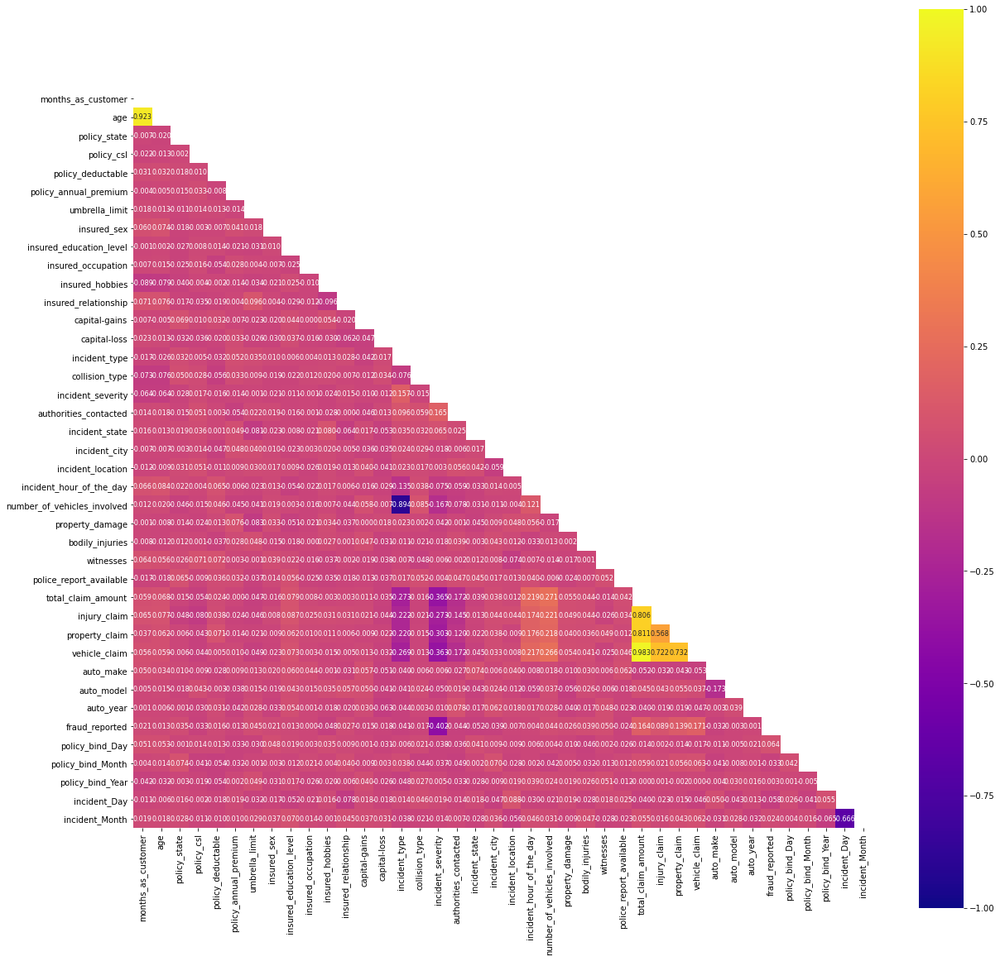

In [110]:
plt.style.use('seaborn-pastel')

upper_triangle = np.triu(df.corr())
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', 
            annot_kws={'size':8}, cmap="plasma", mask=upper_triangle)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

Thus we are not able to find out easily ,but can see few columns shows multicollinearity like all the claims type,incident_severity etc  ,we will be retaining them as they are significant for dependent variable.

# Correlation of features with our label

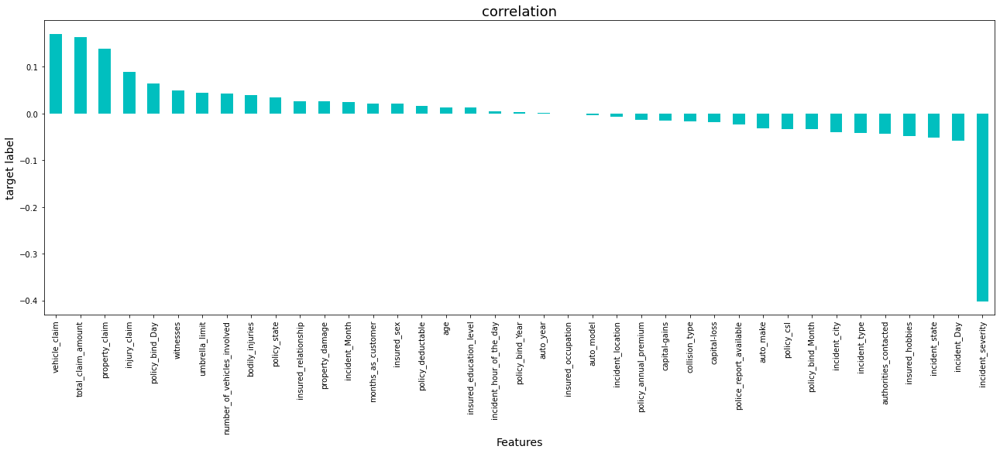

In [111]:
#bar plot showing correlation bw target and features
plt.figure(figsize=(22,7))
dfnew.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='c')
plt.xlabel('Features',fontsize=14)
plt.ylabel('target label',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

As above the heatmap was not able to give us a clearer picture on positive and negative correlation columns.So we used bar plot which clearly showing the 
positive and negtaive correlation with the target column.Thus we see that dependent varibale fraud reported is positvely correlated iwth vehicle_claim,total_claim_amount,property_claim,
collision_type,inury_claim,policy_bind_day,witnesses,umbrella_limit,policy_state and negatively correlated with incident_severity and incident_day.So we will retain all the columns.

# skewness Analysis

skewness is a measure of asymmetry of the probability distribution about its mean and helps describe the shape of the probability distribution. Basically it measures the level of how much a given distribution is different from a normal distribution (which is symmetric). 

Distribution on the basis of skewness value:

Skewness = 0: Then normally distributed.

Skewness > 0: Then more weight in the left tail of the distribution,positively skewed .

Skewness < 0: Then more weight in the right tail of the distribution,negative skewed.

In [112]:
df.skew()

months_as_customer             0.362608
age                            0.475385
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_type                  0.090563
collision_type                -0.032778
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
incident_location             -0.003369
incident_hour_of_the_day      -0.039280
number_of_vehicles_involved    0.509725
property_damage                0.853093
bodily_injuries                0.003757


As a general rule of thumb,If skewness is less than -1 or greater than 1, the distribution is highly skewed.

If skewness is between -1 and -0.5 or between 0.5 and 1, the distribution is moderately skewed.

If skewness is between -0.5 and 0.5, the distribution is approximately symmetric.

Considering the threshold as -0.5/+0.5,we can see some of the columns are skewed and skeweness will be removed later. 

# Splitting the dataset into 2  dependent variable and independent variable into x and y respectively

In [113]:
x = df.drop('fraud_reported', axis=1)
y = df['fraud_reported']

# Feature Scaling

I have used standard scaler to normalise the data which means StandardScaler() function to standardize the data values into a standard format.

In [114]:
from sklearn.preprocessing import StandardScaler
X_features=x
x=StandardScaler().fit_transform(x)

# Removing Skewness using PowerTransform

Power transform :Power transforms are a family of parametric, monotonic transformations that are applied to make data more Gaussian-like.
The method i have used here is yeo-johnson as it works with both positive and negative values.    

In [115]:
#using power transform it can work uoon both negative and positive skewed value 
from sklearn.preprocessing import power_transform
x=power_transform(x,method='yeo-johnson')
x

array([[ 1.06780242,  1.00222686,  1.18647778, ...,  1.64923277,
         1.14091246, -1.03333806],
       [ 0.28807594,  0.4321888 , -0.03996338, ...,  0.61358062,
         0.76107856, -1.03333806],
       [-0.5720032 , -1.15065892,  1.18647778, ..., -0.19119613,
         0.85615811, -0.14630425],
       ...,
       [-0.61152973, -0.48248016,  1.18647778, ...,  0.21529469,
         0.95115422, -1.03333806],
       [ 1.96860726,  2.14066526, -1.22178475, ...,  1.26451279,
         1.23568181, -0.14630425],
       [ 1.95541507,  1.98936793,  1.18647778, ..., -0.7457133 ,
         1.23568181, -0.14630425]])

# Fixing the class imbalance in our label column

In [116]:
y.value_counts() #checking

0.0    740
1.0    240
Name: fraud_reported, dtype: int64

In [117]:
#  samples to make all the target categorical  values same
oversample = SMOTE()
x, y = oversample.fit_resample(x, y)

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

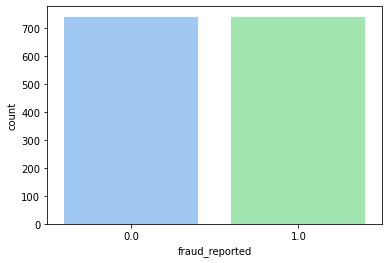

In [118]:
sns.countplot(y) #showing balanced data visiually

# MODEL BUILDING

In [119]:
lg = LogisticRegression()
from sklearn.model_selection import train_test_split

# Find the best random state

In [145]:
maxRS=0
maxAccu=0

for i in range(1, 1000):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=i)
    lg=LogisticRegression()
    lg.fit(x_train, y_train)
    pred = lg.predict(x_test)
    acc = accuracy_score(y_test, pred)
    
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i

print("Best Accuracy score is", maxAccu,"on Random State", maxRS)

Best Accuracy score is 0.7893660531697342 on Random State 348


Thus we see that the best random sttae is 348 where the accuracy score is 78.9%

# Base model:Logistic Regression

In [121]:
#Importing train_test_split and accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

In [146]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.33, random_state=348)

In [147]:
from sklearn.metrics import classification_report,confusion_matrix
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

[[127 111]
 [126 125]]
              precision    recall  f1-score   support

         0.0       0.50      0.53      0.52       238
         1.0       0.53      0.50      0.51       251

    accuracy                           0.52       489
   macro avg       0.52      0.52      0.52       489
weighted avg       0.52      0.52      0.52       489



 The accuracy score for logistic regression is 52% 

Confusion matrix:It compares the actual target values with those predicted by the machine learning model and what kinds of errors it is making.Thus we see here in 2*2 matrix above,different values of the confusion matrix as explained below:

True Positive(TP)=127,It states that 127 positive class data points were correctly classified by the model.

True Negative(TN)=125,It states that 125 negative class data points were correctly classified by the model.

False Positive(FP)=111,It states that 111 negative class data points were incorrectly classified as belonging to the positive class by the model.

False Negative(FN)=126 ,It states that 126 positive class data points were incorrectly classified as belonging to the negative class by the model.

Thus we see that its not a good classifier as from our dataset as there is large number of false positive and false negative values.

# Cross validation score for logistic regression

We will check for cross validation for reducing overfitting issues and see whether the score has improved or not

In [148]:
pred_lg=lg.predict(x_test)
from sklearn.model_selection import cross_val_score
css=accuracy_score(y_test,pred_lg)

In [149]:
for j in range(2,10):
    css_score=cross_val_score(lg,x,y,cv=j)
    csc=css_score.mean()
    print("At cv:-",j)
    print("cross validation score is :-",csc*100)
    print("accuracy score is :-",css*100)
    print('\n')

At cv:- 2
cross validation score is :- 73.58108108108108
accuracy score is :- 80.16359918200409


At cv:- 3
cross validation score is :- 73.98628025829905
accuracy score is :- 80.16359918200409


At cv:- 4
cross validation score is :- 74.05405405405405
accuracy score is :- 80.16359918200409


At cv:- 5
cross validation score is :- 74.72972972972973
accuracy score is :- 80.16359918200409


At cv:- 6
cross validation score is :- 74.25913125528015
accuracy score is :- 80.16359918200409


At cv:- 7
cross validation score is :- 74.0546875998007
accuracy score is :- 80.16359918200409


At cv:- 8
cross validation score is :- 74.5945945945946
accuracy score is :- 80.16359918200409


At cv:- 9
cross validation score is :- 74.79962223864662
accuracy score is :- 80.16359918200409




Thus we see that difference between cross validation score and accuracy score is almost same in all cases,so we will be taking default
value that is cv=5 in this case.

In [150]:
csc_selected=cross_val_score(lg,x,y,cv=5).mean()
print("The  cv score is :-",csc_selected *100,"\n The accuracy score is ",css*100)

The  cv score is :- 74.72972972972973 
 The accuracy score is  80.16359918200409


We will take cv score as the final accuracy score which is 74.72% as it has reduced the overfitting problem.Thus we see that after cross validation,the accuracy score has improved from 52% to 74.72% which is good.

# Modelling-Other models

In [151]:
#Model 1-Decision Tree

from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier

model1=DecisionTreeClassifier(random_state=348)
model1.fit(x_train,y_train)
y_pred1=model1.predict(x_test)
print(confusion_matrix(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[193  45]
 [ 37 214]]
              precision    recall  f1-score   support

         0.0       0.84      0.81      0.82       238
         1.0       0.83      0.85      0.84       251

    accuracy                           0.83       489
   macro avg       0.83      0.83      0.83       489
weighted avg       0.83      0.83      0.83       489



The accuracy score for DecisionTreeClassifier is 83% from classification report.

Confusion matrix:It compares the actual target values with those predicted by the machine learning model and what kinds of errors it is making.Thus we see here in 2*2 matrix above,different values of the confusion matrix as explained below:

True Positive(TP)=193,It states that 193 positive class data points were correctly classified by the model.

True Negative(TN)=214,It states that 214 negative class data points were correctly classified by the model.

False Positive(FP)=45,It states that 45 negative class data points were incorrectly classified as belonging to the positive class by the model.

False Negative(FN)=37 ,It states that 37 positive class data points were incorrectly classified as belonging to the negative class by the model.

Thus we see that its a good classifier as from our dataset it can disntinguisn larger number of true positive and true negative values

In [174]:
#Model 2-Random Forest

from sklearn.ensemble import RandomForestClassifier

model2=RandomForestClassifier(random_state=348)
model2.fit(x_train,y_train)
y_pred2=model2.predict(x_test)
print(confusion_matrix(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[225  13]
 [ 36 215]]
              precision    recall  f1-score   support

         0.0       0.86      0.95      0.90       238
         1.0       0.94      0.86      0.90       251

    accuracy                           0.90       489
   macro avg       0.90      0.90      0.90       489
weighted avg       0.90      0.90      0.90       489



The accuracy score for Random Forest Classifier is 90% from classification report.

Confusion matrix:It compares the actual target values with those predicted by the machine learning model and what kinds of errors it is making.Thus we see here in 2*2 matrix above,different values of the confusion matrix as explained below:

True Positive(TP)=225,It states that 225 positive class data points were correctly classified by the model.

True Negative(TN)=215,It states that 215 negative class data points were correctly classified by the model.

False Positive(FP)=13,It states that 13 negative class data points were incorrectly classified as belonging to the positive class by the model.

False Negative(FN)=36 ,It states that 36 positive class data points were incorrectly classified as belonging to the negative class by the model.

Thus we see that its a good classifier as from our dataset it can disntinguisn larger number of true positive and true negative values and errors are less.

In [153]:
#Model 3-Ada Boost

from sklearn.ensemble import AdaBoostClassifier

model3=AdaBoostClassifier(random_state=348)
model3.fit(x_train,y_train)
y_pred3=model3.predict(x_test)
print(confusion_matrix(y_test,y_pred3))
print(classification_report(y_test,y_pred3))

[[219  19]
 [ 51 200]]
              precision    recall  f1-score   support

         0.0       0.81      0.92      0.86       238
         1.0       0.91      0.80      0.85       251

    accuracy                           0.86       489
   macro avg       0.86      0.86      0.86       489
weighted avg       0.86      0.86      0.86       489



The accuracy score for Ada Boost Classifier is 86% from classification report.

Confusion matrix:It compares the actual target values with those predicted by the machine learning model and what kinds of errors it is making.Thus we see here in 2*2 matrix above,different values of the confusion matrix as explained below:

True Positive(TP)=219,It states that 219 positive class data points were correctly classified by the model.

True Negative(TN)=200,It states that 200 negative class data points were correctly classified by the model.

False Positive(FP)=19,It states that 19 negative class data points were incorrectly classified as belonging to the positive class by the model.

False Negative(FN)=51 ,It states that 51 positive class data points were incorrectly classified as belonging to the negative class by the model.

Thus we see that its a good classifier as from our dataset it can disntinguisn larger number of true positive and true negative values and errors are less

In [154]:
#Model 4- KNeighbors Classifier
from sklearn.neighbors import KNeighborsClassifier
model4=KNeighborsClassifier(n_neighbors=20)
model4.fit(x_train,y_train)
y_pred4=model4.predict(x_test)
print(confusion_matrix(y_test,y_pred4))
print(classification_report(y_test,y_pred4))

[[ 75 163]
 [ 12 239]]
              precision    recall  f1-score   support

         0.0       0.86      0.32      0.46       238
         1.0       0.59      0.95      0.73       251

    accuracy                           0.64       489
   macro avg       0.73      0.63      0.60       489
weighted avg       0.72      0.64      0.60       489



The accuracy score for Kneighbors Classifier is 64% from classification report.

Confusion matrix:It compares the actual target values with those predicted by the machine learning model and what kinds of errors it is making.Thus we see here in 2*2 matrix above,different values of the confusion matrix as explained below:

True Positive(TP)=75,It states that 75 positive class data points were correctly classified by the model.

True Negative(TN)=239,It states that 239 negative class data points were correctly classified by the model.

False Positive(FP)=163,It states that 163 negative class data points were incorrectly classified as belonging to the positive class by the model.

False Negative(FN)=12 ,It states that 12 positive class data points were incorrectly classified as belonging to the negative class by the model.

Thus we see that its  not that good classifier as from our dataset it is showing high false positive value.

In [155]:
#Model 5-SVM
from sklearn.svm import SVC
model5=SVC(random_state=348)
model5.fit(x_train,y_train)
y_pred5=model5.predict(x_test)
print(confusion_matrix(y_test,y_pred5))
print(classification_report(y_test,y_pred5))

[[222  16]
 [ 36 215]]
              precision    recall  f1-score   support

         0.0       0.86      0.93      0.90       238
         1.0       0.93      0.86      0.89       251

    accuracy                           0.89       489
   macro avg       0.90      0.89      0.89       489
weighted avg       0.90      0.89      0.89       489



 The accuracy score for Support Vector Classifier is 89% from classification report.

Confusion matrix:It compares the actual target values with those predicted by the machine learning model and what kinds of errors it is making.Thus we see here in 2*2 matrix above,different values of the confusion matrix as explained below:

True Positive(TP)=222,It states that 222 positive class data points were correctly classified by the model.

True Negative(TN)=215,It states that 215 negative class data points were correctly classified by the model.

False Positive(FP)=16,It states that 16 negative class data points were incorrectly classified as belonging to the positive class by the model.

False Negative(FN)=36 ,It states that 36 positive class data points were incorrectly classified as belonging to the negative class by the model.

Thus we see that its a good classifier as from our dataset it can disntinguisn larger number of true positive and true negative values and errors are less

Thus we see,

The accuracy score of Decision tree classifier is 83%

The accuracy score of Random Forest Classifier is 90%

The accuracy score of Kneighbors Classifier is 64%

The accuracy score of Ada Boosting is 86%

The accuracy score of Support vector machine (SVM) is 89%

Conclusion: We see that almost all the models are showing good accuracy rate except Kneighbors ,
now we will check cross validation for all the models for overfitting.

# CROSS VALIDATION For the models

In [156]:
from sklearn.model_selection import cross_val_score
scr=cross_val_score(lg,x,y,cv=5)
print("The cross validation score of Logistic Regression model is :",scr.mean())

The cross validation score of Logistic Regression model is : 0.7472972972972973


In [157]:
scr=cross_val_score(model1,x,y,cv=5)
print("The cross validation score of Desicion Tree Classifier is :",scr.mean())

The cross validation score of Desicion Tree Classifier is : 0.8398648648648649


In [158]:
scr=cross_val_score(model2,x,y,cv=5)
print("The cross validation score of Random Forest Classifier is :",scr.mean())

The cross validation score of Random Forest Classifier is : 0.8756756756756756


In [159]:
scr=cross_val_score(model3,x,y,cv=5)
print("The cross validation score of AdaBoost Classifier is :",scr.mean())

The cross validation score of AdaBoost Classifier is : 0.8486486486486486


In [160]:
scr=cross_val_score(model4,x,y,cv=5)
print("The cross validation score of Kneighbors Classifier is :",scr.mean())

The cross validation score of Kneighbors Classifier is : 0.6229729729729729


In [137]:
scr=cross_val_score(model5,x,y,cv=5)
print("The cross validation score of SVM Classifier is :",scr.mean())

The cross validation score of SVM Classifier is : 0.8648648648648649


Thus we see that after doing cross validation ,we can see the scores that Cross validation score of all the models have been reduced which means that cross validation is not decreasing the accuracy,it is rather giving us a better approximation for that accuracy, including less overfitting.So as per the avobe models:

Cross validation score :

Logistic Regression:74.72%

Desicion Tree:83.98%

RandomForest:87.56%

AdaBoost:84.86%

Kneighbors:62.29%    

SVM:86.48%

So I am taking Random Forest Classifier and SVM for hyperparameter tuning under GridSearch compare to other models.

# HYper parameter tuning

Hyper parameter optimisation in machine learning intends to find the hyper parameters of a given machine learning algorithm that deliver the best performance as measured on a validation set.

Using Scikit-Learn’s GridSearchCV method, we can explicitly specify every combination of settings to try. We do this with GridSearchCV, a method that, instead of sampling randomly from a distribution, evaluates all combinations we define.

# RANDOM FOREST HYPERTUNNING

Random Forest Classifier-Hypertunning parameters:
n_estimators = number of trees in the foreset
max_features = max number of features considered for splitting a node
max_depth = max number of levels in each decision tree
criterion =The function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “entropy” for the information gain.    
    


In [161]:
from sklearn.model_selection import GridSearchCV
#creating parameter list to pass in gridsearchcv
parameters= {'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']}

In [163]:
model2=RandomForestClassifier(random_state=348)
GCV=GridSearchCV(model2,parameters,cv=5,scoring='accuracy')
GCV.fit(x_train,y_train)
print(GCV.best_params_)#Printing the best p arameters obtained
print(GCV.best_score_) #Mean cross-validated score of best_estimator

{'criterion': 'gini', 'max_depth': 8, 'max_features': 'log2', 'n_estimators': 500}
0.8597279325922541


In [164]:
#fitting the best parameters
GCV=RandomForestClassifier(max_depth=8,n_estimators=500,criterion='gini',max_features='log2')
GCV.fit(x_train,y_train)  
pred=GCV.predict(x_test)
print('Accuracy score: ',accuracy_score(y_test,pred)*100)
print('Cross validation score: ',cross_val_score(GCV,x,y,cv=5,scoring='accuracy').mean()*100)

Accuracy score:  89.77505112474438
Cross validation score:  86.95945945945948


Thus after cross validation and then doing hypertuning with best parametrs the accuracy score is 89.77% and cross validation
score is 86.96% though the scores has reduced very slight but this is the best approximation after reducing overtting.

# Support Vector Classifier-Hypertunning

In [169]:
from sklearn.svm import SVC
parameters={ 'kernel' :["linear", "rbf"],
              'gamma' :["scale", "auto"],
              'C' : [2.0, 4.0,3.0,5.0],
              'degree' :[3,4,5,6]      
            }

model5=SVC()
clf=GridSearchCV(model5,parameters,cv=5,scoring='accuracy')
clf.fit(x_train,y_train)
print(clf.best_params_)

{'C': 5.0, 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf'}


In [170]:
#fitting the best parameters
clf=SVC(C=5.0,degree=3,gamma='scale',kernel='rbf')
clf.fit(x_train,y_train)  
pred=clf.predict(x_test)
print('Accuracy score: ',accuracy_score(y_test,pred)*100)
print('Cross validation score: ',cross_val_score(clf,x,y,cv=5,scoring='accuracy').mean()*100)

Accuracy score:  90.79754601226993
Cross validation score:  90.2027027027027


Thus we see here in SVC,the accuracy score is 90.79% and cross validation score is 90.20%,the gap between the accuracy score and cross validation score is very less.that means we are in the right path.


# Model Analysis

Comparing both the models that is random forest classifier and Support Vector classifier considering the hyperparameter tuning
Model                         Accuracy Score      Cross validation score    
Random Forest                   89.77                     86.95               
Support Vector Classifier       90.79                     90.20               

We find that support vector classifier performs well considering that cross validation score after hypertuning has improved from 86.95 to 90.20% and accuracy score has improved from 86.48% to 90.79% which has reduce overfitting issues.Also the gap between accuracy score and cross validation score is very less .Thus we take this our best fit model.

# AUC_ROC PLOT

It is a performance measurement for the classification problems at various threshold settings. ROC is a probability curve and AUC represents the degree or measure of separability. It tells how much the model is capable of distinguishing between classes. Higher the AUC, the better the model is at predicting 0s as 0s and 1s as 1s.

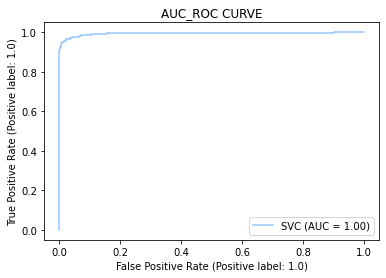

In [171]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(clf,x,y)
plt.title("AUC_ROC CURVE")
plt.show()  

OBSERVATION: So final accuracy is 90% as our cross val score accurcay and auc_roc score is 100 % which is very good and 
here we can see our AUC (c-value) is far greater than 0.5 ,it is 1.00 which can be considered very good which means 
that the classifier is able to disntinguish between 0s and 1s. So it can distinguish the whether auto fraud claim is genuine or not.We can defintly employ this model.

# Feature Importance

<AxesSubplot:>

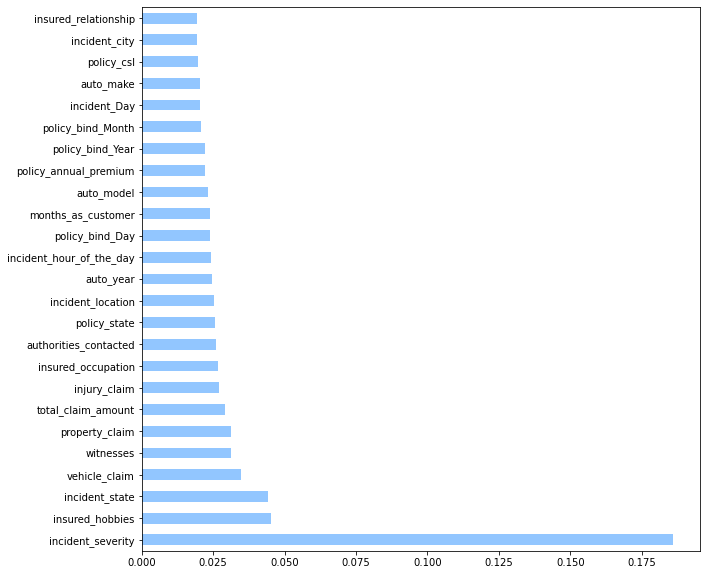

In [175]:
#Feature Selection via Random Forest
feature_imp=pd.Series(model2.feature_importances_,index=X_features.columns)
feature_imp.nlargest(25).plot(kind='barh',figsize=(10,10))

Thus we see that incident_severity is the most important feature for insurance claim fruad detection followed by insured_hobbies.

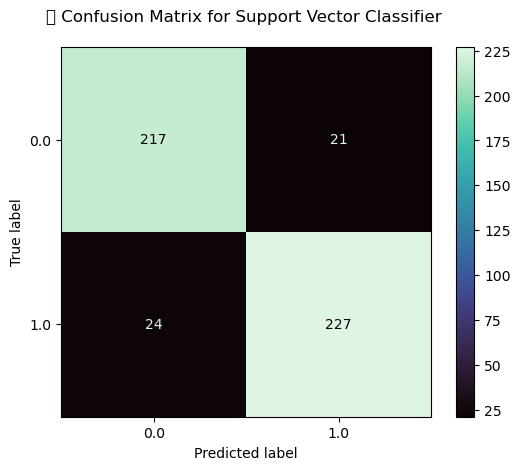

In [179]:
plt.style.use('default')

class_names = df.columns
metrics.plot_confusion_matrix(clf, x_test, y_test, cmap='mako')
plt.title('\t Confusion Matrix for Support Vector Classifier \n')
plt.show()

Thus we see confusion matrix after hypertuning gives us result as below:
Confusion matrix:It compares the actual target values with those predicted by the machine learning model and what kinds of errors it is making.Thus we see here in 2*2 matrix above,different values of the confusion matrix as explained below:

True Positive(TP)=217,It states that 217 positive class data points were correctly classified by the model.

True Negative(TN)=227,It states that 227 negative class data points were correctly classified by the model.

False Positive(FP)=21,It states that 21 negative class data points were incorrectly classified as belonging to the positive class by the model.

False Negative(FN)=24 ,It states that 24 positive class data points were incorrectly classified as belonging to the negative class by the model.

Thus we see that its a good classifier as from our dataset it can disntinguisn larger number of true positive and true negative values and errors are less    

# SAVING THE MODEL

In [180]:
#saving the Random forest Model with hypertuning best parameters
import pickle
filename='insurance_fraud.pkl'
pickle.dump(clf,open(filename,'wb'))

# CONCLUSION:

In [182]:
loaded_model=pickle.load(open('insurance_fraud.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100) #it gives us 90.79% accuracy which is very good.

90.79754601226993


In [183]:
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])
conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488
Predicted,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
Original,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.

This test shows that the model is able to predict the correct accuracy of 90.79%.Thus we see
model is best fit model.